## Telecom Churn Case Study

**Business problem overview**

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

For many incumbent operators, retaining high profitable customers is the number one business goal.


To reduce customer churn, telecom companies need to predict which customers are at high risk of churn.

 

In this project, we will analyse customer-level data of a leading telecom firm, building predictive models to identify customers at high risk of churn and identify the main indicators of churn.

**Business Goal**

Building models to predict churn. The predictive model that we’re going to build will serve two purposes:

It will be used to predict whether a high-value customer will churn or not, in near future (i.e. churn phase). By knowing this, the company can take action steps such as providing special plans, discounts on recharge etc.

It will be used to identify important variables that are strong predictors of churn. These variables may also indicate why customers choose to switch to other networks.

## Importing Libraries

In [1]:
# Basic EDA
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
import re

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

# Model Preparation
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from imblearn.over_sampling import SMOTE
from sklearn.decomposition import PCA
from sklearn.decomposition import IncrementalPCA

# Model Building
from sklearn import tree
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier


# Model performance
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,recall_score,precision_score,accuracy_score

# Model Validation
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score


### Importing Dataset

In [2]:
df = pd.read_csv("telecom_churn_data.csv")

In [3]:
#lets observe the churn data
df.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [4]:
#Checking the dimension of data frame
df.shape

(99999, 226)

In [5]:
#Checking attributes of dataFrame
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


In [6]:
#Checking the mean, median, standard deviation of data Frame columns
df.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.0,96140.0,94621.0,92254.0,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621

In [7]:
print(df.columns.to_list())

['mobile_number', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8', 'last_date_of_month_9', 'arpu_6', 'arpu_7', 'arpu_8', 'arpu_9', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'onnet_mou_9', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'offnet_mou_9', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_ic_mou_9', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'roam_og_mou_9', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2t_mou_9', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2m_mou_9', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_t2c_mou_9', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'loc_og_mou_9', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2t_mou_9', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou

In [8]:
#Renaming the last 4 columns for maintaining similarity
df = df.rename(columns={'jun_vbc_3g':'vbc_3g_6', 'jul_vbc_3g':'vbc_3g_7', 'aug_vbc_3g':'vbc_3g_8', 'sep_vbc_3g':'vbc_3g_9'})

### Data Cleaning

In [9]:
#Checking missing values
df.isna().sum().sort_values(ascending=False)

arpu_3g_6                   74846
night_pck_user_6            74846
total_rech_data_6           74846
arpu_2g_6                   74846
max_rech_data_6             74846
fb_user_6                   74846
av_rech_amt_data_6          74846
date_of_last_rech_data_6    74846
count_rech_2g_6             74846
count_rech_3g_6             74846
date_of_last_rech_data_7    74428
total_rech_data_7           74428
fb_user_7                   74428
max_rech_data_7             74428
night_pck_user_7            74428
count_rech_2g_7             74428
av_rech_amt_data_7          74428
arpu_2g_7                   74428
count_rech_3g_7             74428
arpu_3g_7                   74428
total_rech_data_9           74077
count_rech_3g_9             74077
fb_user_9                   74077
max_rech_data_9             74077
arpu_3g_9                   74077
date_of_last_rech_data_9    74077
night_pck_user_9            74077
arpu_2g_9                   74077
count_rech_2g_9             74077
av_rech_amt_da

In [10]:
#Checking percentage of null values of all columns
df.isnull().sum().sort_values(ascending=False)/len(df.index)*100

arpu_3g_6                   74.846748
night_pck_user_6            74.846748
total_rech_data_6           74.846748
arpu_2g_6                   74.846748
max_rech_data_6             74.846748
fb_user_6                   74.846748
av_rech_amt_data_6          74.846748
date_of_last_rech_data_6    74.846748
count_rech_2g_6             74.846748
count_rech_3g_6             74.846748
date_of_last_rech_data_7    74.428744
total_rech_data_7           74.428744
fb_user_7                   74.428744
max_rech_data_7             74.428744
night_pck_user_7            74.428744
count_rech_2g_7             74.428744
av_rech_amt_data_7          74.428744
arpu_2g_7                   74.428744
count_rech_3g_7             74.428744
arpu_3g_7                   74.428744
total_rech_data_9           74.077741
count_rech_3g_9             74.077741
fb_user_9                   74.077741
max_rech_data_9             74.077741
arpu_3g_9                   74.077741
date_of_last_rech_data_9    74.077741
night_pck_us

In [11]:
df.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,

In [12]:
#Imputing all the important columns' missing value with '0' for model building and High value customer identification
col_impute_0 = ['arpu_3g_6','night_pck_user_6','total_rech_data_6','arpu_2g_6','max_rech_data_6','fb_user_6','av_rech_amt_data_6','count_rech_2g_6','count_rech_3g_6','total_rech_data_7','fb_user_7','max_rech_data_7','night_pck_user_7','count_rech_2g_7','av_rech_amt_data_7','arpu_2g_7','count_rech_3g_7','arpu_3g_7','total_rech_data_9','count_rech_3g_9','fb_user_9','max_rech_data_9','arpu_3g_9','night_pck_user_9','arpu_2g_9','count_rech_2g_9','av_rech_amt_data_9','total_rech_data_8','arpu_3g_8','fb_user_8','night_pck_user_8','av_rech_amt_data_8','max_rech_data_8','count_rech_3g_8','arpu_2g_8','count_rech_2g_8']
df[col_impute_0] = df[col_impute_0].replace(np.nan, 0)

In [13]:
#Checking percentage of null values of all columns
df.isnull().sum().sort_values(ascending=False)/len(df.index)*100

date_of_last_rech_data_6    74.846748
date_of_last_rech_data_7    74.428744
date_of_last_rech_data_9    74.077741
date_of_last_rech_data_8    73.660737
loc_ic_t2t_mou_9             7.745077
loc_og_mou_9                 7.745077
std_ic_t2f_mou_9             7.745077
loc_og_t2t_mou_9             7.745077
std_ic_t2m_mou_9             7.745077
loc_og_t2m_mou_9             7.745077
loc_og_t2f_mou_9             7.745077
std_ic_t2t_mou_9             7.745077
loc_og_t2c_mou_9             7.745077
loc_ic_mou_9                 7.745077
std_og_t2m_mou_9             7.745077
std_og_t2t_mou_9             7.745077
loc_ic_t2f_mou_9             7.745077
std_ic_t2o_mou_9             7.745077
loc_ic_t2m_mou_9             7.745077
std_og_t2f_mou_9             7.745077
std_og_t2c_mou_9             7.745077
std_og_mou_9                 7.745077
og_others_9                  7.745077
isd_og_mou_9                 7.745077
roam_og_mou_9                7.745077
spl_og_mou_9                 7.745077
roam_ic_mou_

In [14]:
#Looking at the columns which are having only values 0 and NaN
print(df['loc_og_t2o_mou'].unique())
print(df['std_og_t2o_mou'].unique())
print(df['loc_ic_t2o_mou'].unique())
print(df['std_og_t2c_mou_6'].unique())
print(df['std_og_t2c_mou_7'].unique())
print(df['std_og_t2c_mou_8'].unique())
print(df['std_og_t2c_mou_9'].unique())
print(df['std_ic_t2o_mou_6'].unique())
print(df['std_ic_t2o_mou_7'].unique())
print(df['std_ic_t2o_mou_8'].unique())
print(df['std_ic_t2o_mou_9'].unique())

[ 0. nan]
[ 0. nan]
[ 0. nan]
[nan  0.]
[nan  0.]
[ 0. nan]
[nan  0.]
[nan  0.]
[nan  0.]
[ 0. nan]
[nan  0.]


In [15]:
#Lets Drop these above columns from dataset
df.drop(['loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou','std_og_t2c_mou_6','std_og_t2c_mou_7','std_og_t2c_mou_8','std_og_t2c_mou_9','std_ic_t2o_mou_6','std_ic_t2o_mou_7','std_ic_t2o_mou_8','std_ic_t2o_mou_9'], inplace=True, axis=1)

In [16]:
#Dropping the column mobile_number of customers and circle_id as these are irrevelent to model
df.drop(['mobile_number','circle_id'], inplace=True, axis=1)

In [17]:
#Dropping the columns having more than 70% null values
df.drop(['date_of_last_rech_data_6','date_of_last_rech_data_7','date_of_last_rech_data_8','date_of_last_rech_data_9'], inplace=True, axis=1)

In [18]:
# Imputing all remaining missing values with median
null = df.isnull().sum().sort_values(ascending=False)/len(df.index)*100
null_col = list(null.loc[null > 0].index)

In [19]:
df[null_col]=df[null_col].replace(np.nan, df[null_col].median())

In [20]:
#Checking percentage of null values of all columns
df.isnull().sum().sort_values(ascending=False)/len(df.index)*100

date_of_last_rech_9     4.760048
date_of_last_rech_8     3.622036
date_of_last_rech_7     1.767018
last_date_of_month_9    1.659017
date_of_last_rech_6     1.607016
last_date_of_month_8    1.100011
last_date_of_month_7    0.601006
last_date_of_month_6    0.000000
total_rech_data_6       0.000000
max_rech_amt_8          0.000000
max_rech_amt_9          0.000000
last_day_rch_amt_6      0.000000
last_day_rch_amt_7      0.000000
last_day_rch_amt_8      0.000000
last_day_rch_amt_9      0.000000
total_rech_data_8       0.000000
total_rech_data_7       0.000000
max_rech_amt_6          0.000000
total_rech_data_9       0.000000
max_rech_data_6         0.000000
max_rech_data_7         0.000000
max_rech_data_8         0.000000
max_rech_data_9         0.000000
count_rech_2g_6         0.000000
count_rech_2g_7         0.000000
count_rech_2g_8         0.000000
count_rech_2g_9         0.000000
max_rech_amt_7          0.000000
total_rech_amt_8        0.000000
total_rech_amt_9        0.000000
isd_ic_mou

In [21]:
# Converting dtype of date columns to datetime
df['last_date_of_month_6'] = pd.to_datetime(df['last_date_of_month_6'], format='%m/%d/%Y')
df['last_date_of_month_7'] = pd.to_datetime(df['last_date_of_month_7'], format='%m/%d/%Y')
df['last_date_of_month_8'] = pd.to_datetime(df['last_date_of_month_8'], format='%m/%d/%Y')
df['last_date_of_month_9'] = pd.to_datetime(df['last_date_of_month_9'], format='%m/%d/%Y')
df['date_of_last_rech_6'] = pd.to_datetime(df['date_of_last_rech_6'], format='%m/%d/%Y')
df['date_of_last_rech_7'] = pd.to_datetime(df['date_of_last_rech_7'], format='%m/%d/%Y')
df['date_of_last_rech_8'] = pd.to_datetime(df['date_of_last_rech_8'], format='%m/%d/%Y')
df['date_of_last_rech_9'] = pd.to_datetime(df['date_of_last_rech_9'], format='%m/%d/%Y')

In [22]:
#Filling null date values with the previous ones
df['date_of_last_rech_9'].fillna(method='pad',inplace=True)
df['date_of_last_rech_8'].fillna(method='pad',inplace=True)
df['date_of_last_rech_7'].fillna(method='pad',inplace=True)
df['last_date_of_month_9'].fillna(method='pad',inplace=True)
df['date_of_last_rech_6'].fillna(method='pad',inplace=True)
df['last_date_of_month_8'].fillna(method='pad',inplace=True)
df['last_date_of_month_7'].fillna(method='pad',inplace=True)

In [23]:
#Checking percentage of null values of all columns
df.isnull().sum().sort_values(ascending=False)/len(df.index)*100

last_date_of_month_6    0.0
std_ic_mou_7            0.0
max_rech_amt_7          0.0
max_rech_amt_8          0.0
max_rech_amt_9          0.0
date_of_last_rech_6     0.0
date_of_last_rech_7     0.0
date_of_last_rech_8     0.0
date_of_last_rech_9     0.0
last_day_rch_amt_6      0.0
last_day_rch_amt_7      0.0
last_day_rch_amt_8      0.0
last_day_rch_amt_9      0.0
total_rech_data_6       0.0
total_rech_data_7       0.0
total_rech_data_8       0.0
total_rech_data_9       0.0
max_rech_data_6         0.0
max_rech_data_7         0.0
max_rech_data_8         0.0
max_rech_data_9         0.0
count_rech_2g_6         0.0
count_rech_2g_7         0.0
count_rech_2g_8         0.0
count_rech_2g_9         0.0
max_rech_amt_6          0.0
total_rech_amt_9        0.0
total_rech_amt_8        0.0
isd_ic_mou_7            0.0
std_ic_mou_9            0.0
total_ic_mou_6          0.0
total_ic_mou_7          0.0
total_ic_mou_8          0.0
total_ic_mou_9          0.0
spl_ic_mou_6            0.0
spl_ic_mou_7        

We have taken care of all null values

## Feature Engineering

Creating new features of average recharge amount for the month of June and July to identify High Value Customers


In [24]:
#Calculating total data recharge amount spent in the month of June, July, August

df['total_rech_amt_data_6']=df['av_rech_amt_data_6']*df['total_rech_data_6']
df['total_rech_amt_data_7']=df['av_rech_amt_data_7']*df['total_rech_data_7']
df['total_rech_amt_data_8']=df['av_rech_amt_data_8']*df['total_rech_data_8']

In [25]:
# Calculating total monthly recharge amount spent for data (mobile internet) and call
df['total_month_rech_6']=df['total_rech_amt_6']+df['total_rech_amt_data_6']
df['total_month_rech_7']=df['total_rech_amt_7']+df['total_rech_amt_data_7']
df['total_month_rech_8']=df['total_rech_amt_8']+df['total_rech_amt_data_8']

Now extracting High value customers whose average total monthly recharge amount spent for data (mobile internet) and call in the first two months (June and July) more than the 70th percentile

In [26]:
hvcust_df=df[df[['total_month_rech_6','total_month_rech_7']].mean(axis=1)>df[['total_month_rech_6','total_month_rech_7']].mean(axis=1).quantile(0.7)]

In [27]:
print("Total number of High value customer is %d" %hvcust_df.shape[0])

Total number of High value customer is 29953


Now tagging the churned customers (churn=1, else 0) based on the fourth month (September) as follows: Those who have not made any calls (either incoming or outgoing) and have not used mobile internet even once in the churn phase. 

The attributes we need to use to tag churners are:

total_ic_mou_9

total_og_mou_9

vol_2g_mb_9

vol_3g_mb_9

In [28]:
col_att=['total_ic_mou_9','total_og_mou_9','vol_2g_mb_9','vol_3g_mb_9']

In [29]:
hvcust_df['churn']=hvcust_df[col_att].apply(lambda x: 1 if ((x['total_ic_mou_9']==0) & (x['total_og_mou_9']==0) & (x['vol_2g_mb_9']==0) & (x['vol_3g_mb_9']==0)) else 0, axis=1)

In [30]:
hvcust_df.head()

,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,total_month_rech_6,total_month_rech_7,total_month_rech_8,churn
0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,197.385,214.816,213.803,21.100,34.31,32.33,0.00,29.84,96.31,91.735,0.00,87.29,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,11.91,11.61,0.00,11.26,41.03,40.43,0.00,39.12,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,65.11,63.685,0.00,61.84,0.00,0.00,0.00,0.00,3.95,3.635,0.00,2.50,0.00,0.00,0.00,0.00,11.64,11.09,0.00,8.41,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,15.69,15.74,0.16,15.66,56.49,57.08,4.13,56.61,0.88,0.93,1.15,0.96,92.16,92.55,5.44,91.64,0.00,0.00,0.00,0.00,2.03,2.04,0.00,1.74,0.00,0.00,0.00,0.0,5.89,5.96,0.00,5.38,0.00,0.00,5.44,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,4,3,2,6,362,252,252,0,252,252,252,0,2014-06-21,2014-07-16,2014-08-08,2014-09-28,252,252,252,0,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,0.0,0.0,0.0,0.

In [31]:
hvcust_df['churn'].value_counts()

0    27520
1     2433
Name: churn, dtype: int64

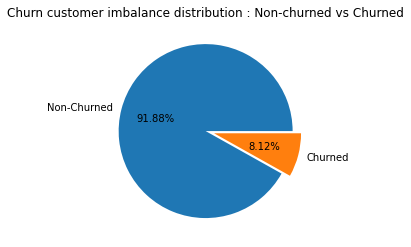

In [32]:
plt.pie(hvcust_df['churn'].value_counts(normalize=True)*100, labels=['Non-Churned','Churned'],explode=(0,0.1),autopct='%1.2f%%')
plt.title('Churn customer imbalance distribution : Non-churned vs Churned')
plt.show()

After tagging churners, removing all the attributes corresponding to the churn phase (all attributes having ‘ _9’, etc. in their names).

In [33]:
import re
#filtering out all columns where column name ending with _9
col_9 = hvcust_df.filter(regex=('_9')).columns
#Dropping these columns
hvcust_df.drop(col_9,axis=1,inplace=True)

In [34]:
hvcust_df.head()

,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,total_month_rech_6,total_month_rech_7,total_month_rech_8,churn
0,2014-06-30,2014-07-31,2014-08-31,197.385,214.816,213.803,34.31,32.33,0.00,96.31,91.735,0.00,0.00,0.00,0.00,0.00,0.00,0.00,11.91,11.61,0.00,41.03,40.43,0.00,0.00,0.00,0.00,0.0,0.0,0.00,65.11,63.685,0.00,0.00,0.00,0.00,3.95,3.635,0.00,0.00,0.00,0.00,11.64,11.09,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,15.69,15.74,0.16,56.49,57.08,4.13,0.88,0.93,1.15,92.16,92.55,5.44,0.00,0.00,0.00,2.03,2.04,0.00,0.00,0.00,0.00,5.89,5.96,0.00,0.00,0.00,5.44,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,4,3,2,362,252,252,252,252,252,2014-06-21,2014-07-16,2014-08-08,252,252,252,1.0,1.0,1.0,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,252.0,252.0,252.0,30.13,1.32,5.75,83.57,150.76,109.61,212.17,212.17,212.17,212.17,212.17,212.17,0.0,0.0,0.0,0,0,0,0,0,0,1,1,1,0,0,0,1.0,1.0,1.0,968,30.40,0.00,101.20,252.0,252.0,252.0,614.0,504.0,504.0,1
7,2014-06-30,2014-07-31,2014-08-31,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.160,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.910,255.79,4.30,23.29,12.01,49.89,31.760,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.5,0.0,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,2014-06-27,2014-07-25,2014-08-26,0,0,779,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0

In [35]:
#dataframe dimension after removing september month columns
hvcust_df.shape

(29953, 164)

### Duplicate value check

In [36]:
# Are there any duplicates ?
dups = hvcust_df.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))
hvcust_df[dups].head(2)

Number of duplicate rows = 0


,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,total_month_rech_6,total_month_rech_7,total_month_rech_8,churn


## Exploratory Data Analysis

### Univariate Analysis of Numerical Variables

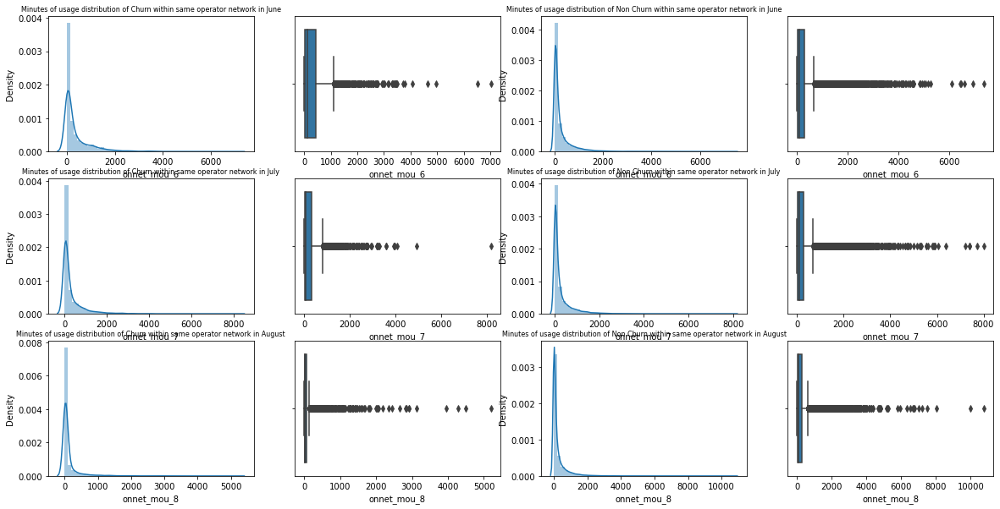

In [37]:
#Checking Minutes of usage of voice calls distribution within same operator network for Churn vs non churned

plt.figure(figsize=(20,10))
plt.subplot(3,4,1)
plt.title('Minutes of usage distribution of Churn within same operator network in June', fontsize=8)
sns.distplot(hvcust_df.loc[hvcust_df.churn == 1].onnet_mou_6)

plt.subplot(3,4,2)
sns.boxplot(hvcust_df.loc[hvcust_df.churn == 1].onnet_mou_6)



plt.subplot(3,4,3)
plt.title('Minutes of usage distribution of Non Churn within same operator network in June', fontsize=8)
sns.distplot(hvcust_df.loc[hvcust_df.churn == 0].onnet_mou_6)

plt.subplot(3,4,4)
sns.boxplot(hvcust_df.loc[hvcust_df.churn == 0].onnet_mou_6)

plt.subplot(3,4,5)
plt.title('Minutes of usage distribution of Churn within same operator network in July', fontsize=8)
sns.distplot(hvcust_df.loc[hvcust_df.churn == 1].onnet_mou_7)

plt.subplot(3,4,6)
sns.boxplot(hvcust_df.loc[hvcust_df.churn == 1].onnet_mou_7)



plt.subplot(3,4,7)
plt.title('Minutes of usage distribution of Non Churn within same operator network in July', fontsize=8)
sns.distplot(hvcust_df.loc[hvcust_df.churn == 0].onnet_mou_7)

plt.subplot(3,4,8)
sns.boxplot(hvcust_df.loc[hvcust_df.churn == 0].onnet_mou_7)

plt.subplot(3,4,9)
plt.title('Minutes of usage distribution of Churn within same operator network in August', fontsize=8)
sns.distplot(hvcust_df.loc[hvcust_df.churn == 1].onnet_mou_8)

plt.subplot(3,4,10)
sns.boxplot(hvcust_df.loc[hvcust_df.churn == 1].onnet_mou_8)



plt.subplot(3,4,11)
plt.title('Minutes of usage distribution of Non Churn within same operator network in August', fontsize=8)
sns.distplot(hvcust_df.loc[hvcust_df.churn == 0].onnet_mou_8)

plt.subplot(3,4,12)
sns.boxplot(hvcust_df.loc[hvcust_df.churn == 0].onnet_mou_8)
plt.show()

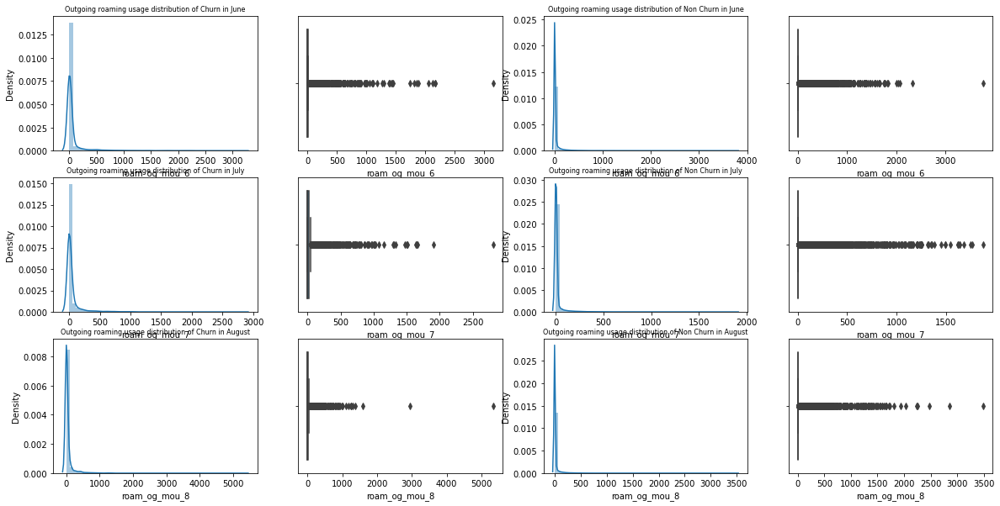

In [38]:
#Checking Outgoing roaming minutes of voice call usage distribution for Churn vs non churned

plt.figure(figsize=(20,10))
plt.subplot(3,4,1)
plt.title('Outgoing roaming usage distribution of Churn in June', fontsize=8)
sns.distplot(hvcust_df.loc[hvcust_df.churn == 1].roam_og_mou_6)

plt.subplot(3,4,2)
sns.boxplot(hvcust_df.loc[hvcust_df.churn == 1].roam_og_mou_6)



plt.subplot(3,4,3)
plt.title('Outgoing roaming usage distribution of Non Churn in June', fontsize=8)
sns.distplot(hvcust_df.loc[hvcust_df.churn == 0].roam_og_mou_6)

plt.subplot(3,4,4)
sns.boxplot(hvcust_df.loc[hvcust_df.churn == 0].roam_og_mou_6)

plt.subplot(3,4,5)
plt.title('Outgoing roaming usage distribution of Churn in July', fontsize=8)
sns.distplot(hvcust_df.loc[hvcust_df.churn == 1].roam_og_mou_7)

plt.subplot(3,4,6)
sns.boxplot(hvcust_df.loc[hvcust_df.churn == 1].roam_og_mou_7)



plt.subplot(3,4,7)
plt.title('Outgoing roaming usage distribution of Non Churn in July', fontsize=8)
sns.distplot(hvcust_df.loc[hvcust_df.churn == 0].roam_og_mou_7)

plt.subplot(3,4,8)
sns.boxplot(hvcust_df.loc[hvcust_df.churn == 0].roam_og_mou_7)

plt.subplot(3,4,9)
plt.title('Outgoing roaming usage distribution of Churn in August', fontsize=8)
sns.distplot(hvcust_df.loc[hvcust_df.churn == 1].roam_og_mou_8)

plt.subplot(3,4,10)
sns.boxplot(hvcust_df.loc[hvcust_df.churn == 1].roam_og_mou_8)



plt.subplot(3,4,11)
plt.title('Outgoing roaming usage distribution of Non Churn in August', fontsize=8)
sns.distplot(hvcust_df.loc[hvcust_df.churn == 0].roam_og_mou_8)

plt.subplot(3,4,12)
sns.boxplot(hvcust_df.loc[hvcust_df.churn == 0].roam_og_mou_8)
plt.show()

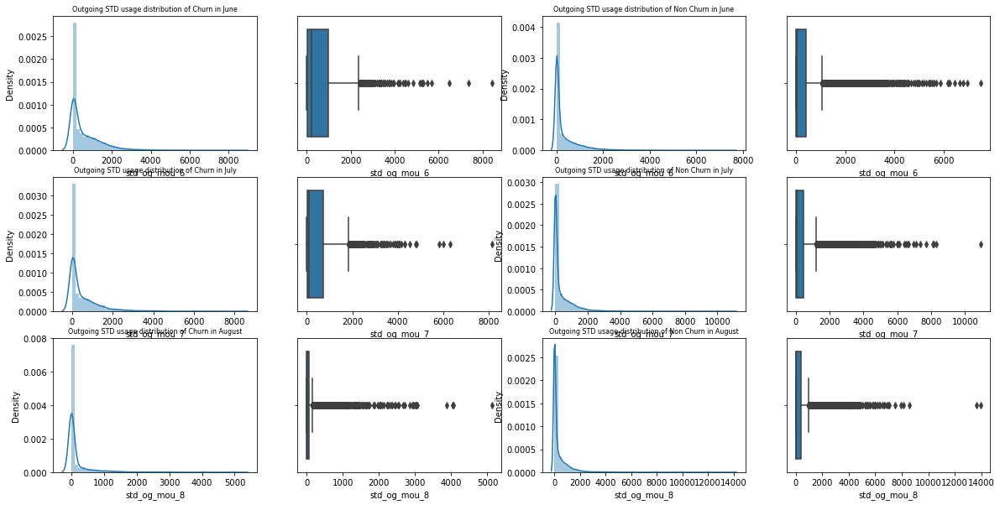

In [39]:
#Checking STD Outgoing minutes of voice call usage distribution for Churn vs non churned

plt.figure(figsize=(20,10))
plt.subplot(3,4,1)
plt.title('Outgoing STD usage distribution of Churn in June', fontsize=8)
sns.distplot(hvcust_df.loc[hvcust_df.churn == 1].std_og_mou_6)

plt.subplot(3,4,2)
sns.boxplot(hvcust_df.loc[hvcust_df.churn == 1].std_og_mou_6)



plt.subplot(3,4,3)
plt.title('Outgoing STD usage distribution of Non Churn in June', fontsize=8)
sns.distplot(hvcust_df.loc[hvcust_df.churn == 0].std_og_mou_6)

plt.subplot(3,4,4)
sns.boxplot(hvcust_df.loc[hvcust_df.churn == 0].std_og_mou_6)

plt.subplot(3,4,5)
plt.title('Outgoing STD usage distribution of Churn in July', fontsize=8)
sns.distplot(hvcust_df.loc[hvcust_df.churn == 1].std_og_mou_7)

plt.subplot(3,4,6)
sns.boxplot(hvcust_df.loc[hvcust_df.churn == 1].std_og_mou_7)



plt.subplot(3,4,7)
plt.title('Outgoing STD usage distribution of Non Churn in July', fontsize=8)
sns.distplot(hvcust_df.loc[hvcust_df.churn == 0].std_og_mou_7)

plt.subplot(3,4,8)
sns.boxplot(hvcust_df.loc[hvcust_df.churn == 0].std_og_mou_7)

plt.subplot(3,4,9)
plt.title('Outgoing STD usage distribution of Churn in August', fontsize=8)
sns.distplot(hvcust_df.loc[hvcust_df.churn == 1].std_og_mou_8)

plt.subplot(3,4,10)
sns.boxplot(hvcust_df.loc[hvcust_df.churn == 1].std_og_mou_8)



plt.subplot(3,4,11)
plt.title('Outgoing STD usage distribution of Non Churn in August', fontsize=8)
sns.distplot(hvcust_df.loc[hvcust_df.churn == 0].std_og_mou_8)

plt.subplot(3,4,12)
sns.boxplot(hvcust_df.loc[hvcust_df.churn == 0].std_og_mou_8)
plt.show()

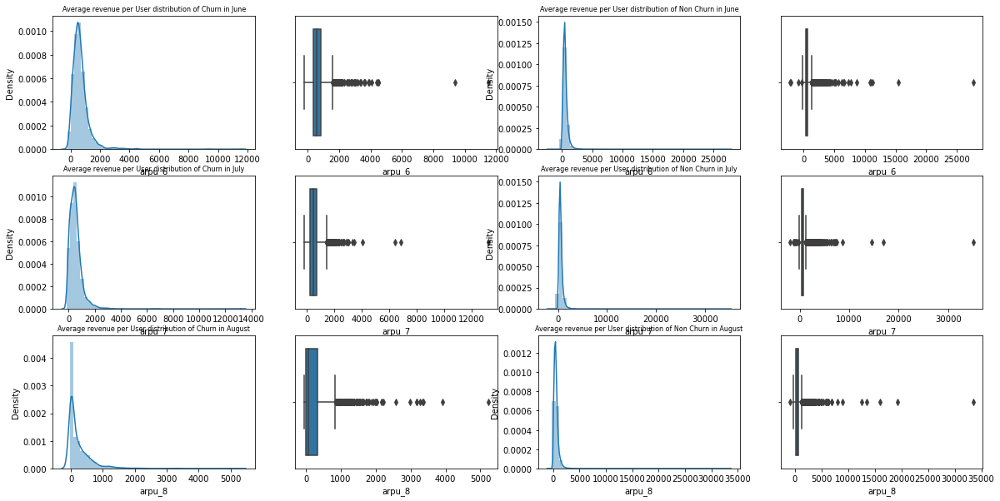

In [40]:
#Checking Average revenue per user distribution for Churn vs non churned

plt.figure(figsize=(20,10))
plt.subplot(3,4,1)
plt.title('Average revenue per User distribution of Churn in June', fontsize=8)
sns.distplot(hvcust_df.loc[hvcust_df.churn == 1].arpu_6)

plt.subplot(3,4,2)
sns.boxplot(hvcust_df.loc[hvcust_df.churn == 1].arpu_6)



plt.subplot(3,4,3)
plt.title('Average revenue per User distribution of Non Churn in June', fontsize=8)
sns.distplot(hvcust_df.loc[hvcust_df.churn == 0].arpu_6)

plt.subplot(3,4,4)
sns.boxplot(hvcust_df.loc[hvcust_df.churn == 0].arpu_6)

plt.subplot(3,4,5)
plt.title('Average revenue per User distribution of Churn in July', fontsize=8)
sns.distplot(hvcust_df.loc[hvcust_df.churn == 1].arpu_7)

plt.subplot(3,4,6)
sns.boxplot(hvcust_df.loc[hvcust_df.churn == 1].arpu_7)



plt.subplot(3,4,7)
plt.title('Average revenue per User distribution of Non Churn in July', fontsize=8)
sns.distplot(hvcust_df.loc[hvcust_df.churn == 0].arpu_7)

plt.subplot(3,4,8)
sns.boxplot(hvcust_df.loc[hvcust_df.churn == 0].arpu_7)

plt.subplot(3,4,9)
plt.title('Average revenue per User distribution of Churn in August', fontsize=8)
sns.distplot(hvcust_df.loc[hvcust_df.churn == 1].arpu_8)

plt.subplot(3,4,10)
sns.boxplot(hvcust_df.loc[hvcust_df.churn == 1].arpu_8)



plt.subplot(3,4,11)
plt.title('Average revenue per User distribution of Non Churn in August', fontsize=8)
sns.distplot(hvcust_df.loc[hvcust_df.churn == 0].arpu_8)

plt.subplot(3,4,12)
sns.boxplot(hvcust_df.loc[hvcust_df.churn == 0].arpu_8)
plt.show()

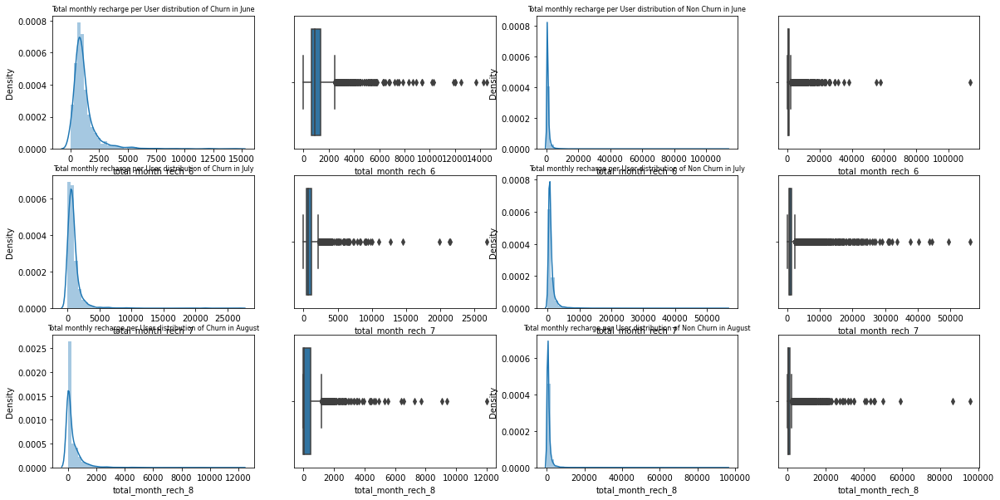

In [41]:
#Checking Total monthly recharge (Internet Data+Voice Call) per user distribution for Churn vs non churned

plt.figure(figsize=(20,10))
plt.subplot(3,4,1)
plt.title('Total monthly recharge per User distribution of Churn in June', fontsize=8)
sns.distplot(hvcust_df.loc[hvcust_df.churn == 1].total_month_rech_6)

plt.subplot(3,4,2)
sns.boxplot(hvcust_df.loc[hvcust_df.churn == 1].total_month_rech_6)



plt.subplot(3,4,3)
plt.title('Total monthly recharge per User distribution of Non Churn in June', fontsize=8)
sns.distplot(hvcust_df.loc[hvcust_df.churn == 0].total_month_rech_6)

plt.subplot(3,4,4)
sns.boxplot(hvcust_df.loc[hvcust_df.churn == 0].total_month_rech_6)

plt.subplot(3,4,5)
plt.title('Total monthly recharge per User distribution of Churn in July', fontsize=8)
sns.distplot(hvcust_df.loc[hvcust_df.churn == 1].total_month_rech_7)

plt.subplot(3,4,6)
sns.boxplot(hvcust_df.loc[hvcust_df.churn == 1].total_month_rech_7)



plt.subplot(3,4,7)
plt.title('Total monthly recharge per User distribution of Non Churn in July', fontsize=8)
sns.distplot(hvcust_df.loc[hvcust_df.churn == 0].total_month_rech_7)

plt.subplot(3,4,8)
sns.boxplot(hvcust_df.loc[hvcust_df.churn == 0].total_month_rech_7)

plt.subplot(3,4,9)
plt.title('Total monthly recharge per User distribution of Churn in August', fontsize=8)
sns.distplot(hvcust_df.loc[hvcust_df.churn == 1].total_month_rech_8)

plt.subplot(3,4,10)
sns.boxplot(hvcust_df.loc[hvcust_df.churn == 1].total_month_rech_8)



plt.subplot(3,4,11)
plt.title('Total monthly recharge per User distribution of Non Churn in August', fontsize=8)
sns.distplot(hvcust_df.loc[hvcust_df.churn == 0].total_month_rech_8)

plt.subplot(3,4,12)
sns.boxplot(hvcust_df.loc[hvcust_df.churn == 0].total_month_rech_8)
plt.show()

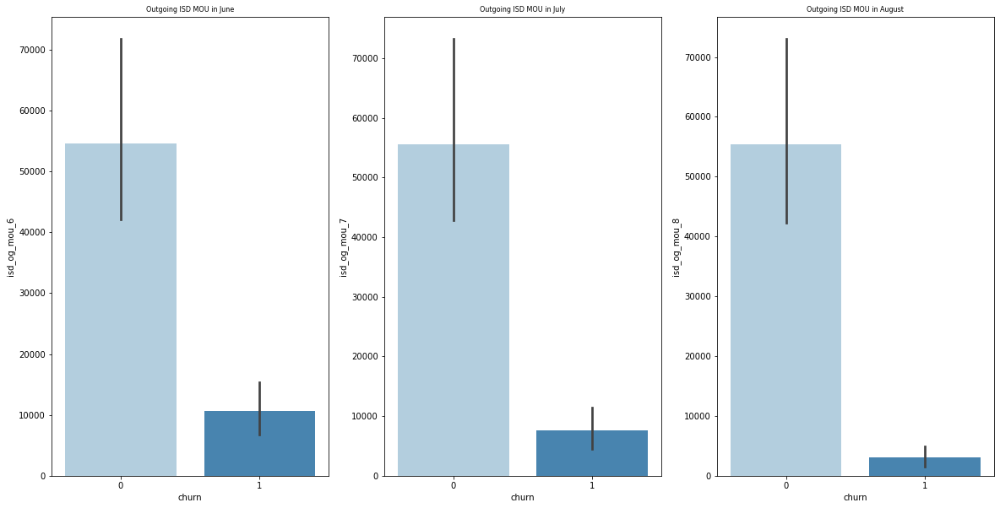

In [42]:
#Outgoing ISD MOU per month - Churned vs Non churned

plt.figure(figsize=(20,10))
plt.subplot(1,3,1)
plt.title('Outgoing ISD MOU in June', fontsize=8)
sns.barplot(x='churn', y='isd_og_mou_6',data=hvcust_df,estimator=sum,palette="Blues")

plt.subplot(1,3,2)
plt.title('Outgoing ISD MOU in July', fontsize=8)
sns.barplot(x='churn', y='isd_og_mou_7',data=hvcust_df,estimator=sum,palette="Blues")

plt.subplot(1,3,3)
plt.title('Outgoing ISD MOU in August', fontsize=8)
sns.barplot(x='churn', y='isd_og_mou_8',data=hvcust_df,estimator=sum,palette="Blues")

plt.show()

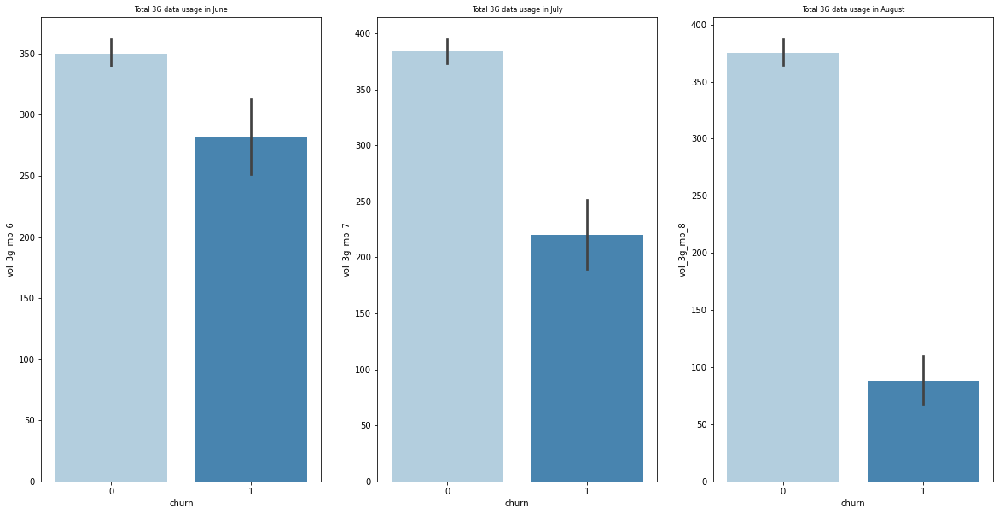

In [43]:
#Total 3G data usage per month - Churned vs Non churned

plt.figure(figsize=(20,10))
plt.subplot(1,3,1)
plt.title('Total 3G data usage in June', fontsize=8)
sns.barplot(x='churn', y='vol_3g_mb_6',data=hvcust_df,palette="Blues")

plt.subplot(1,3,2)
plt.title('Total 3G data usage in July', fontsize=8)
sns.barplot(x='churn', y='vol_3g_mb_7',data=hvcust_df,palette="Blues")

plt.subplot(1,3,3)
plt.title('Total 3G data usage in August', fontsize=8)
sns.barplot(x='churn', y='vol_3g_mb_8',data=hvcust_df,palette="Blues")

plt.show()

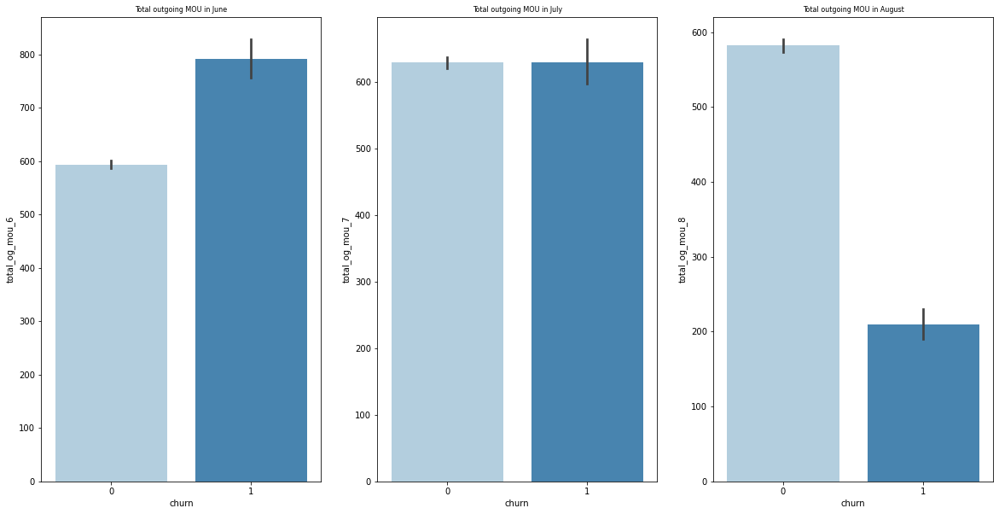

In [44]:
#Total outgoing MOU per month - Churned vs Non churned

plt.figure(figsize=(20,10))
plt.subplot(1,3,1)
plt.title('Total outgoing MOU in June', fontsize=8)
sns.barplot(x='churn', y='total_og_mou_6',data=hvcust_df,palette="Blues")

plt.subplot(1,3,2)
plt.title('Total outgoing MOU in July', fontsize=8)
sns.barplot(x='churn', y='total_og_mou_7',data=hvcust_df,palette="Blues")

plt.subplot(1,3,3)
plt.title('Total outgoing MOU in August', fontsize=8)
sns.barplot(x='churn', y='total_og_mou_8',data=hvcust_df,palette="Blues")

plt.show()

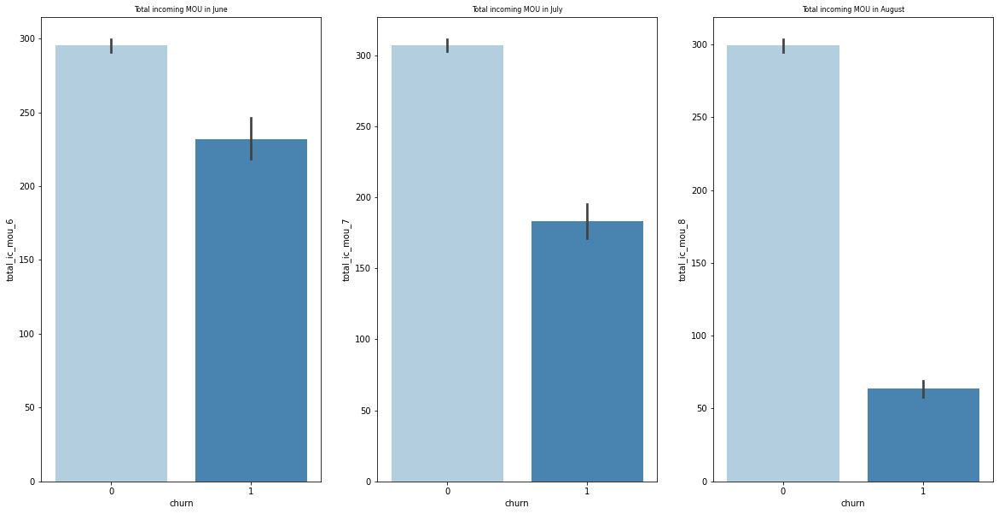

In [45]:
#Total incoming MOU per month - Churned vs Non churned

plt.figure(figsize=(20,10))
plt.subplot(1,3,1)
plt.title('Total incoming MOU in June', fontsize=8)
sns.barplot(x='churn', y='total_ic_mou_6',data=hvcust_df,palette="Blues")

plt.subplot(1,3,2)
plt.title('Total incoming MOU in July', fontsize=8)
sns.barplot(x='churn', y='total_ic_mou_7',data=hvcust_df,palette="Blues")

plt.subplot(1,3,3)
plt.title('Total incoming MOU in August', fontsize=8)
sns.barplot(x='churn', y='total_ic_mou_8',data=hvcust_df,palette="Blues")

plt.show()

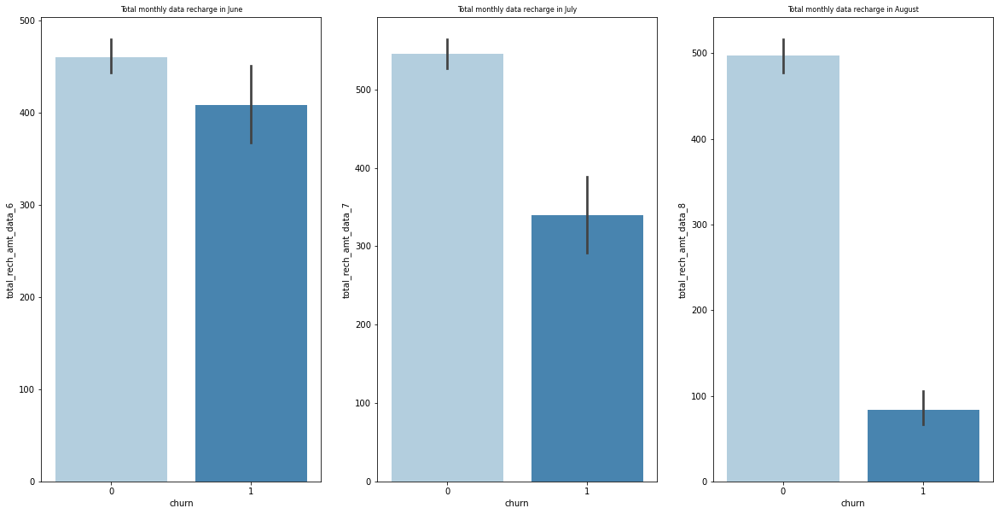

In [46]:
#Total monthly data recharge per month - Churned vs Non churned
plt.figure(figsize=(20,10))
plt.subplot(1,3,1)
plt.title('Total monthly data recharge in June', fontsize=8)
sns.barplot(x='churn', y='total_rech_amt_data_6',data=hvcust_df,palette="Blues")

plt.subplot(1,3,2)
plt.title('Total monthly data recharge in July', fontsize=8)
sns.barplot(x='churn', y='total_rech_amt_data_7',data=hvcust_df,palette="Blues")

plt.subplot(1,3,3)
plt.title('Total monthly data recharge in August', fontsize=8)
sns.barplot(x='churn', y='total_rech_amt_data_8',data=hvcust_df,palette="Blues")

plt.show()

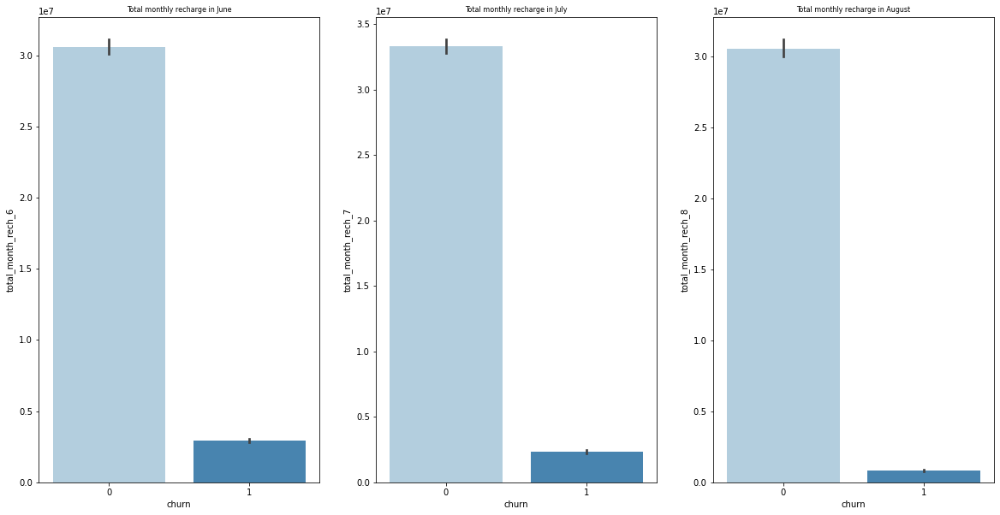

In [47]:
#Total monthly recharge per month - Churned vs Non churned
plt.figure(figsize=(20,10))
plt.subplot(1,3,1)
plt.title('Total monthly recharge in June', fontsize=8)
sns.barplot(x='churn', y='total_month_rech_6',data=hvcust_df,estimator=sum,palette="Blues")

plt.subplot(1,3,2)
plt.title('Total monthly recharge in July', fontsize=8)
sns.barplot(x='churn', y='total_month_rech_7',data=hvcust_df,estimator=sum,palette="Blues")

plt.subplot(1,3,3)
plt.title('Total monthly recharge in August', fontsize=8)
sns.barplot(x='churn', y='total_month_rech_8',data=hvcust_df,estimator=sum,palette="Blues")

plt.show()

### Univariate Analysis of Categorical Variables

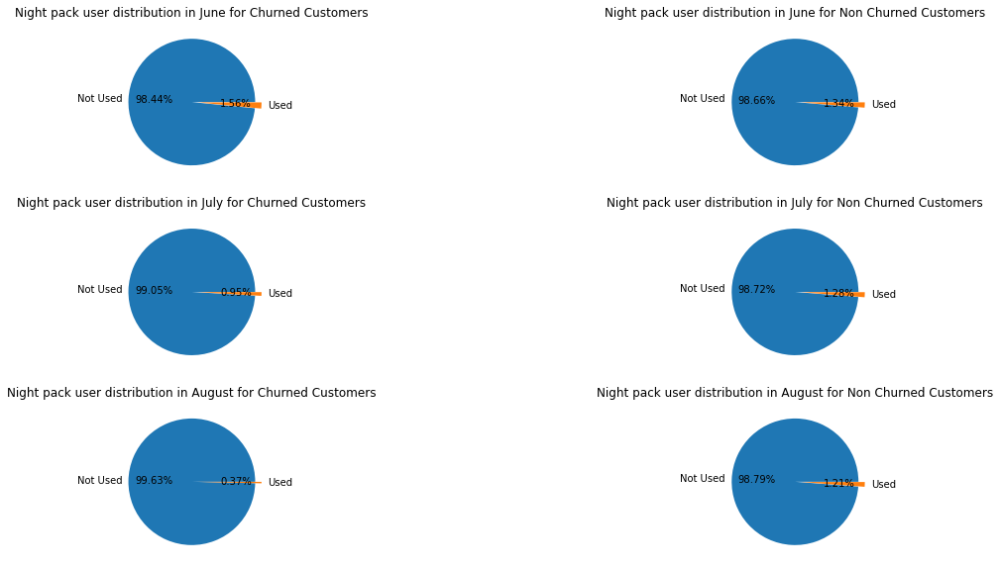

In [48]:
#Checking Night pack User distribution for Churn vs non churned

plt.figure(figsize=(20,10))
plt.subplot(3,2,1)
plt.title('Night pack user distribution in June for Churned Customers')
plt.pie(hvcust_df.loc[hvcust_df.churn == 1].night_pck_user_6.value_counts(normalize=True)*100, labels=['Not Used','Used'],explode=(0,0.1),autopct='%1.2f%%')

plt.subplot(3,2,2)
plt.title('Night pack user distribution in June for Non Churned Customers')
plt.pie(hvcust_df.loc[hvcust_df.churn == 0].night_pck_user_6.value_counts(normalize=True)*100, labels=['Not Used','Used'],explode=(0,0.1),autopct='%1.2f%%')

plt.subplot(3,2,3)
plt.title('Night pack user distribution in July for Churned Customers')
plt.pie(hvcust_df.loc[hvcust_df.churn == 1].night_pck_user_7.value_counts(normalize=True)*100, labels=['Not Used','Used'],explode=(0,0.1),autopct='%1.2f%%')

plt.subplot(3,2,4)
plt.title('Night pack user distribution in July for Non Churned Customers')
plt.pie(hvcust_df.loc[hvcust_df.churn == 0].night_pck_user_7.value_counts(normalize=True)*100, labels=['Not Used','Used'],explode=(0,0.1),autopct='%1.2f%%')

plt.subplot(3,2,5)
plt.title('Night pack user distribution in August for Churned Customers')
plt.pie(hvcust_df.loc[hvcust_df.churn == 1].night_pck_user_8.value_counts(normalize=True)*100, labels=['Not Used','Used'],explode=(0,0.1),autopct='%1.2f%%')

plt.subplot(3,2,6)
plt.title('Night pack user distribution in August for Non Churned Customers')
plt.pie(hvcust_df.loc[hvcust_df.churn == 0].night_pck_user_8.value_counts(normalize=True)*100, labels=['Not Used','Used'],explode=(0,0.1),autopct='%1.2f%%')
plt.show()

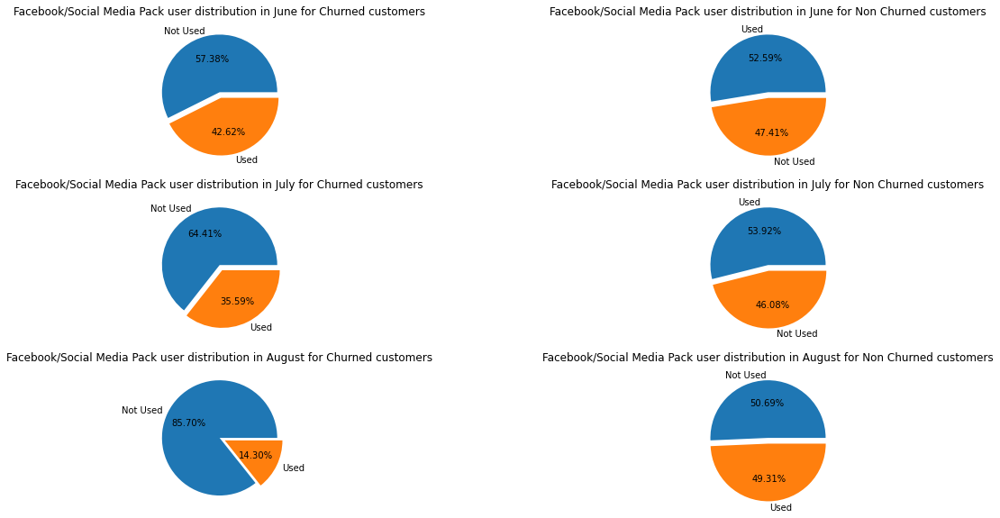

In [49]:
#Checking Facebook/Social Media Pack User distribution for Churn vs non churned

plt.figure(figsize=(20,10))
plt.subplot(3,2,1)
plt.title('Facebook/Social Media Pack user distribution in June for Churned customers')
plt.pie(hvcust_df.loc[hvcust_df.churn == 1].fb_user_6.value_counts(normalize=True)*100, labels=['Not Used','Used'],explode=(0,0.1),autopct='%1.2f%%')

plt.subplot(3,2,2)
plt.title('Facebook/Social Media Pack user distribution in June for Non Churned customers')
plt.pie(hvcust_df.loc[hvcust_df.churn == 0].fb_user_6.value_counts(normalize=True)*100, labels=['Used','Not Used'],explode=(0,0.1),autopct='%1.2f%%')

plt.subplot(3,2,3)
plt.title('Facebook/Social Media Pack user distribution in July for Churned customers')
plt.pie(hvcust_df.loc[hvcust_df.churn == 1].fb_user_7.value_counts(normalize=True)*100, labels=['Not Used','Used'],explode=(0,0.1),autopct='%1.2f%%')

plt.subplot(3,2,4)
plt.title('Facebook/Social Media Pack user distribution in July for Non Churned customers')
plt.pie(hvcust_df.loc[hvcust_df.churn == 0].fb_user_7.value_counts(normalize=True)*100, labels=['Used','Not Used'],explode=(0,0.1),autopct='%1.2f%%')

plt.subplot(3,2,5)
plt.title('Facebook/Social Media Pack user distribution in August for Churned customers')
plt.pie(hvcust_df.loc[hvcust_df.churn == 1].fb_user_8.value_counts(normalize=True)*100, labels=['Not Used','Used'],explode=(0,0.1),autopct='%1.2f%%')

plt.subplot(3,2,6)
plt.title('Facebook/Social Media Pack user distribution in August for Non Churned customers')
plt.pie(hvcust_df.loc[hvcust_df.churn == 0].fb_user_8.value_counts(normalize=True)*100, labels=['Not Used','Used'],explode=(0,0.1),autopct='%1.2f%%')
plt.show()

### Bivariate analysis of Numerical vs Numerical  variables

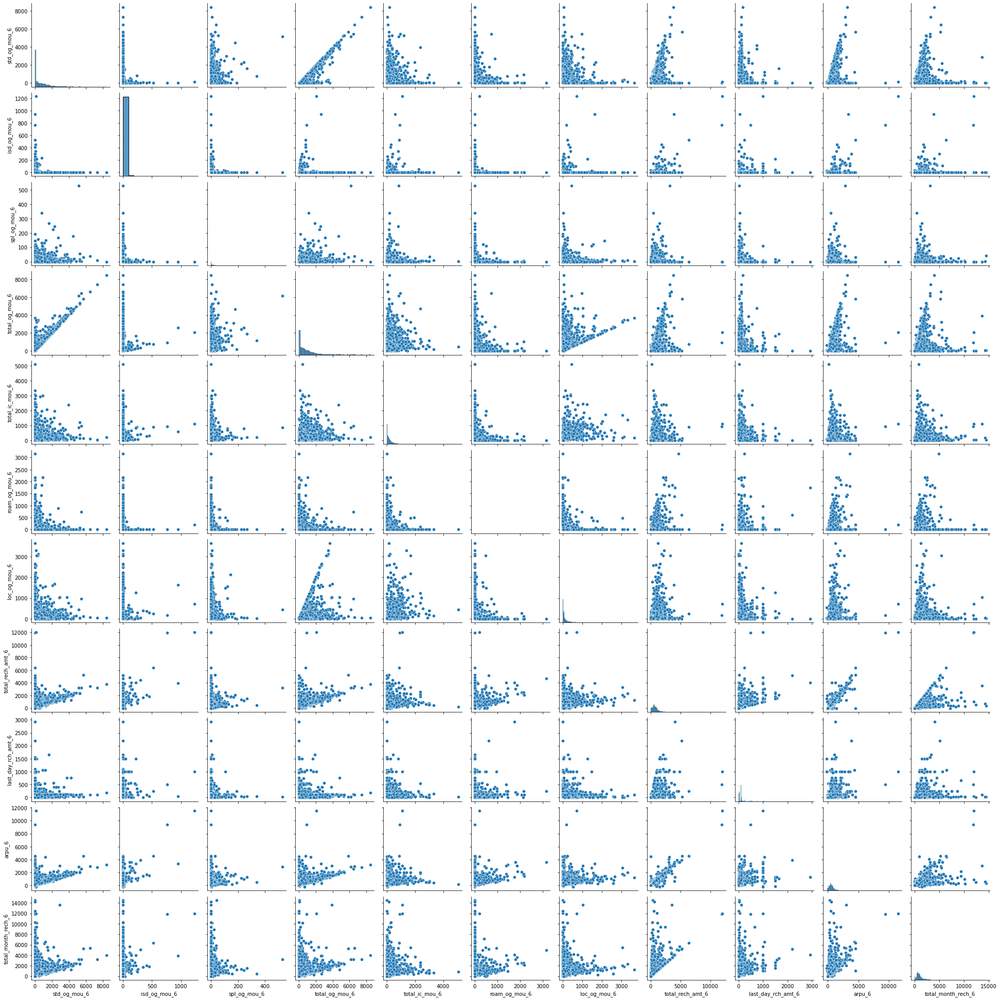

In [50]:
#Churned Customers behaviour on various features in month of June
sns.pairplot(hvcust_df.loc[hvcust_df.churn == 1][['std_og_mou_6','isd_og_mou_6','spl_og_mou_6','total_og_mou_6','total_ic_mou_6','roam_og_mou_6','loc_og_mou_6','total_rech_amt_6','last_day_rch_amt_6','arpu_6','total_month_rech_6']])
plt.show()

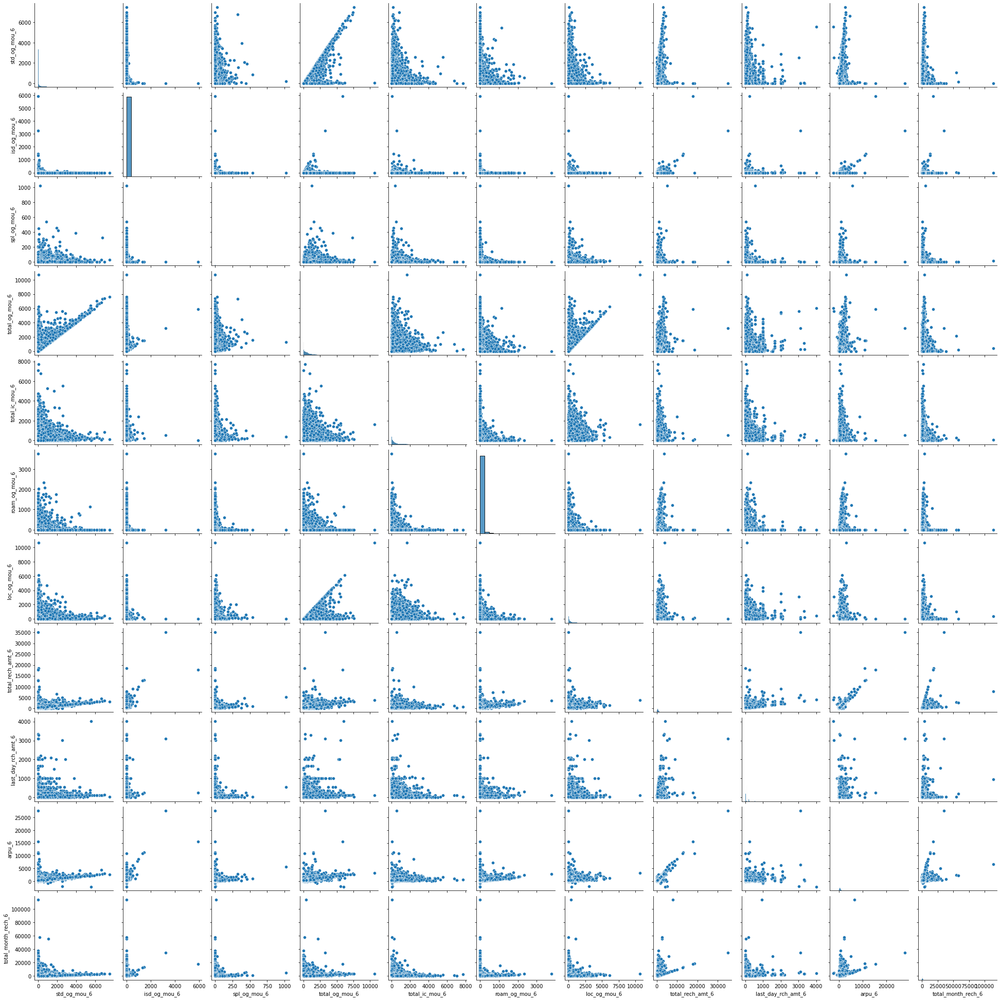

In [51]:
#Non Churned Customers behaviour on various features in month of June
sns.pairplot(hvcust_df.loc[hvcust_df.churn == 0][['std_og_mou_6','isd_og_mou_6','spl_og_mou_6','total_og_mou_6','total_ic_mou_6','roam_og_mou_6','loc_og_mou_6','total_rech_amt_6','last_day_rch_amt_6','arpu_6','total_month_rech_6']])
plt.show()

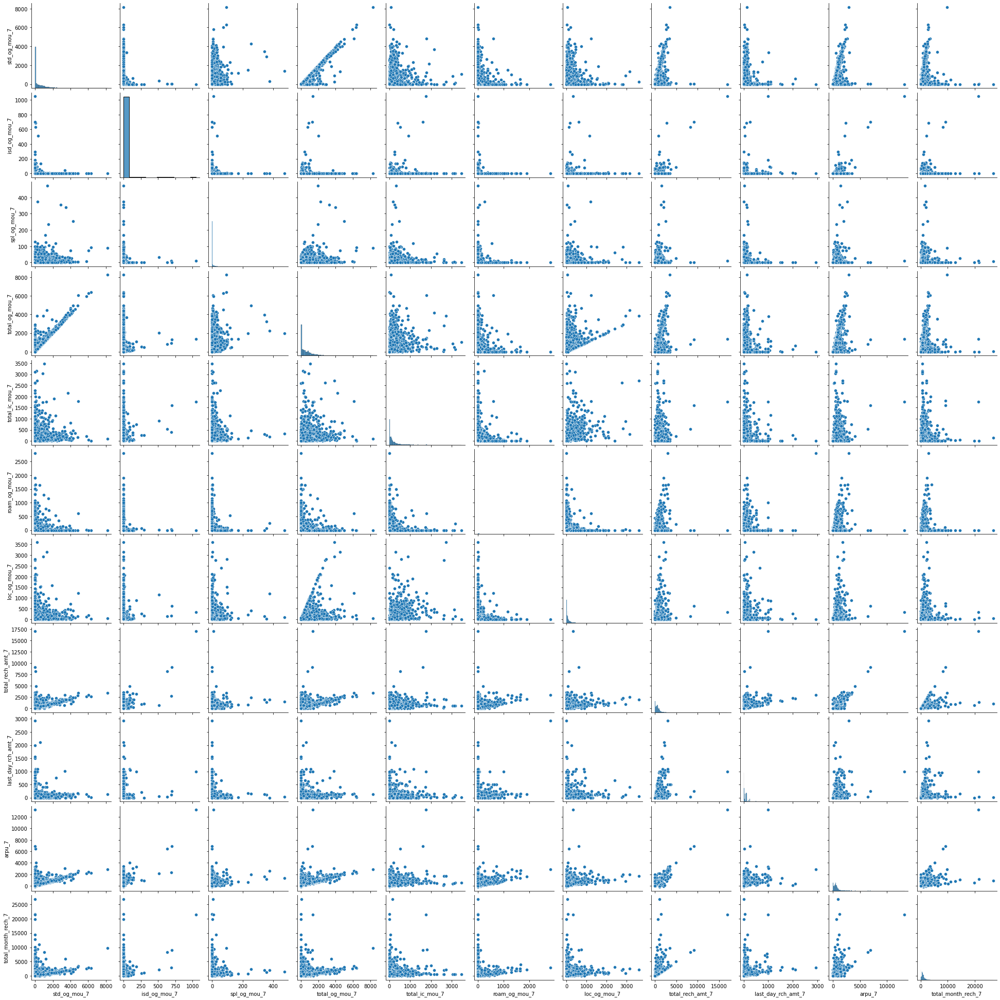

In [52]:
#Churned Customers behaviour on various features in month of July
sns.pairplot(hvcust_df.loc[hvcust_df.churn == 1][['std_og_mou_7','isd_og_mou_7','spl_og_mou_7','total_og_mou_7','total_ic_mou_7','roam_og_mou_7','loc_og_mou_7','total_rech_amt_7','last_day_rch_amt_7','arpu_7','total_month_rech_7']])
plt.show()

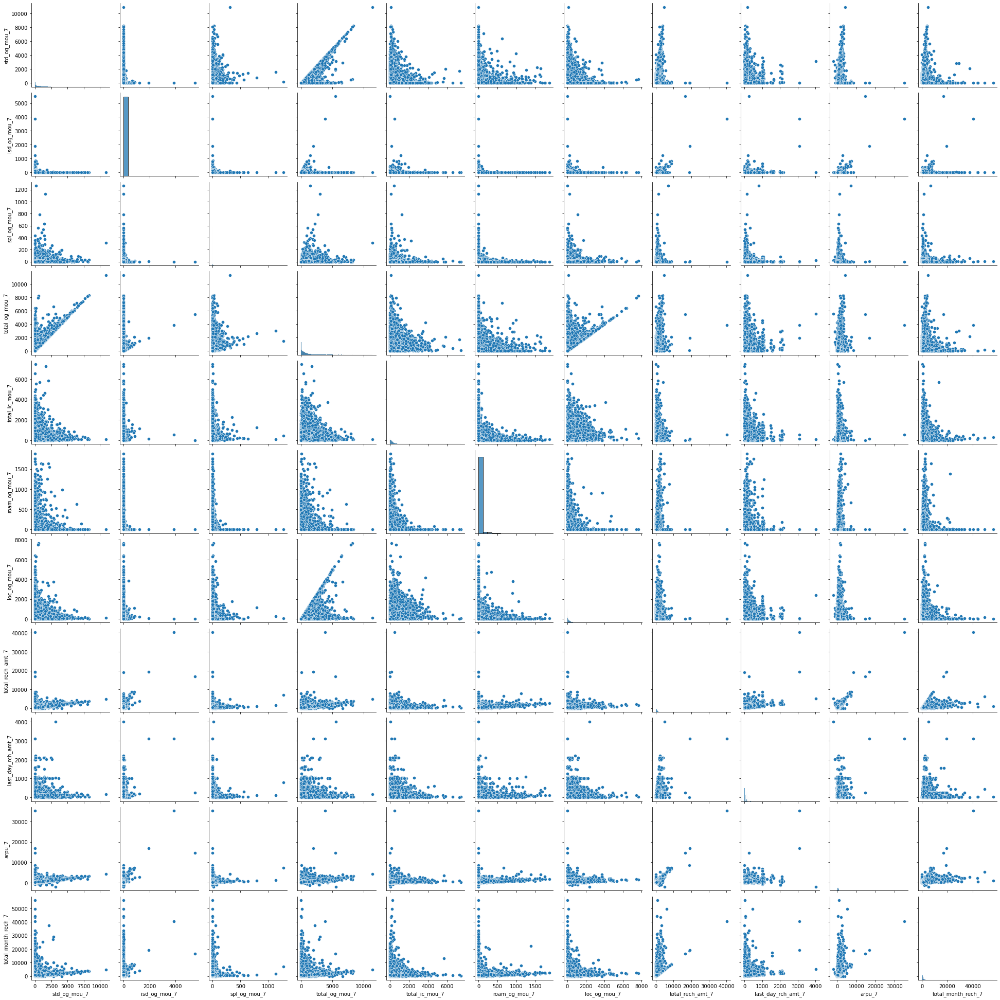

In [53]:
#Non Churned Customers behaviour on various features in month of July
sns.pairplot(hvcust_df.loc[hvcust_df.churn == 0][['std_og_mou_7','isd_og_mou_7','spl_og_mou_7','total_og_mou_7','total_ic_mou_7','roam_og_mou_7','loc_og_mou_7','total_rech_amt_7','last_day_rch_amt_7','arpu_7','total_month_rech_7']])
plt.show()

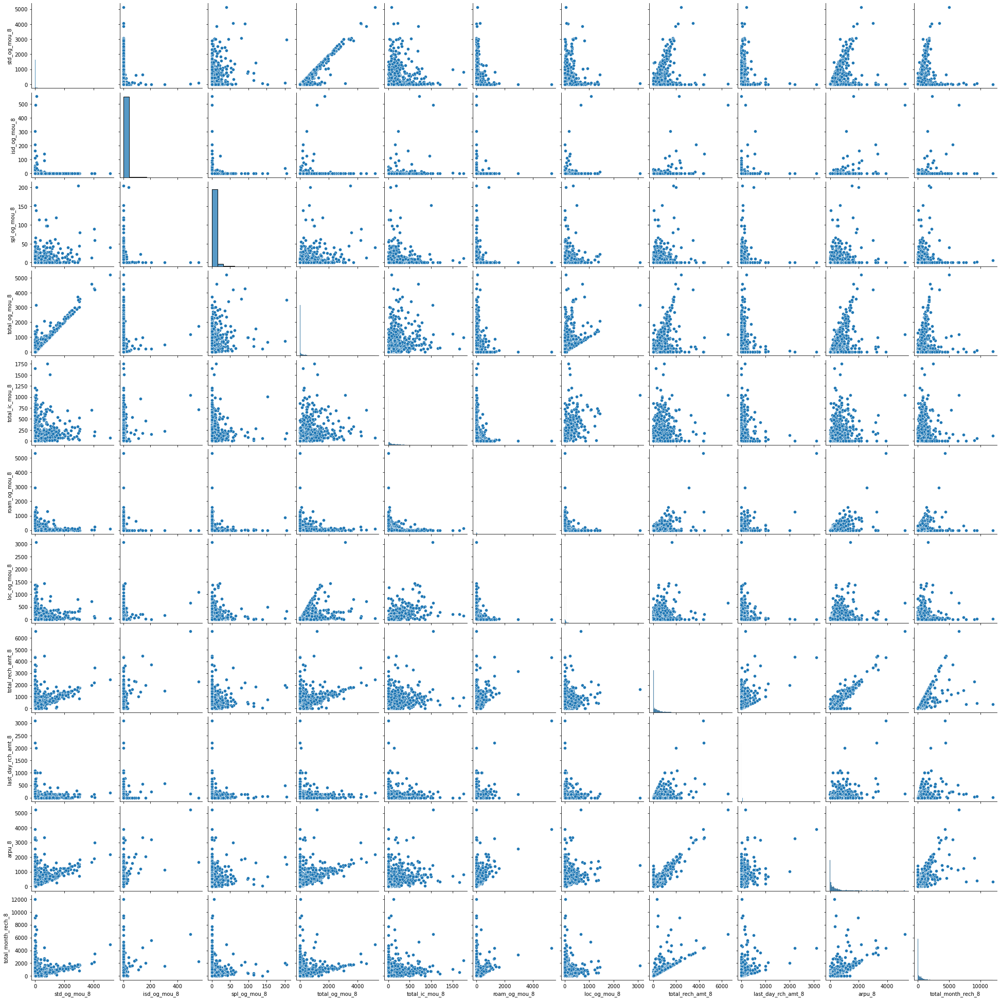

In [54]:
#Churned Customers behaviour on various features in month of August
sns.pairplot(hvcust_df.loc[hvcust_df.churn == 1][['std_og_mou_8','isd_og_mou_8','spl_og_mou_8','total_og_mou_8','total_ic_mou_8','roam_og_mou_8','loc_og_mou_8','total_rech_amt_8','last_day_rch_amt_8','arpu_8','total_month_rech_8']])
plt.show()

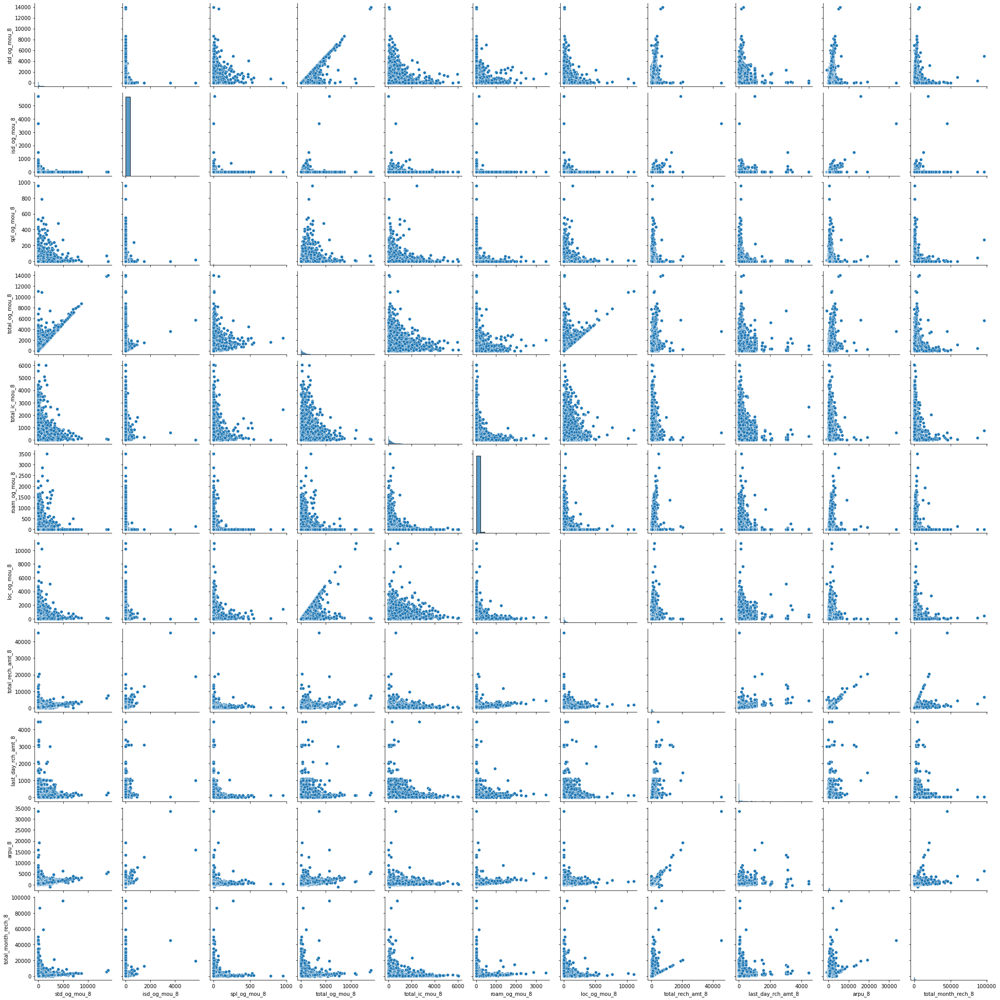

In [55]:
#Non Churned Customers behaviour on various features in month of August
sns.pairplot(hvcust_df.loc[hvcust_df.churn == 0][['std_og_mou_8','isd_og_mou_8','spl_og_mou_8','total_og_mou_8','total_ic_mou_8','roam_og_mou_8','loc_og_mou_8','total_rech_amt_8','last_day_rch_amt_8','arpu_8','total_month_rech_8']])
plt.show()

**EDA Observations**

- Incoming calls usage dropped gradually from month 6th to month 8th
- Outgoing calls usage dropped gradually from month 6th to month 8th
- Total recharge amount dropped in month 8th
- Data usage dropped in month 8th
- All the drops are significant

In [56]:
# Storing the dataset into another frame for further action
hvcust_df_pca = hvcust_df

In [57]:
hvcust_df_pca.head()

,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,total_month_rech_6,total_month_rech_7,total_month_rech_8,churn
0,2014-06-30,2014-07-31,2014-08-31,197.385,214.816,213.803,34.31,32.33,0.00,96.31,91.735,0.00,0.00,0.00,0.00,0.00,0.00,0.00,11.91,11.61,0.00,41.03,40.43,0.00,0.00,0.00,0.00,0.0,0.0,0.00,65.11,63.685,0.00,0.00,0.00,0.00,3.95,3.635,0.00,0.00,0.00,0.00,11.64,11.09,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,15.69,15.74,0.16,56.49,57.08,4.13,0.88,0.93,1.15,92.16,92.55,5.44,0.00,0.00,0.00,2.03,2.04,0.00,0.00,0.00,0.00,5.89,5.96,0.00,0.00,0.00,5.44,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,4,3,2,362,252,252,252,252,252,2014-06-21,2014-07-16,2014-08-08,252,252,252,1.0,1.0,1.0,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,252.0,252.0,252.0,30.13,1.32,5.75,83.57,150.76,109.61,212.17,212.17,212.17,212.17,212.17,212.17,0.0,0.0,0.0,0,0,0,0,0,0,1,1,1,0,0,0,1.0,1.0,1.0,968,30.40,0.00,101.20,252.0,252.0,252.0,614.0,504.0,504.0,1
7,2014-06-30,2014-07-31,2014-08-31,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.160,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.910,255.79,4.30,23.29,12.01,49.89,31.760,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.5,0.0,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,2014-06-27,2014-07-25,2014-08-26,0,0,779,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0

In [58]:
# removing datetime columns from dataset
datecols = list(hvcust_df_pca.select_dtypes(include=['datetime']).columns)
print(datecols)

['last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8', 'date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8']


In [59]:
hvcust_df_pca.drop(datecols, axis=1, inplace=True)

In [60]:
hvcust_df_pca.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,total_month_rech_6,total_month_rech_7,total_month_rech_8,churn
0,197.385,214.816,213.803,34.31,32.33,0.00,96.31,91.735,0.00,0.00,0.00,0.00,0.00,0.00,0.00,11.91,11.61,0.00,41.03,40.43,0.00,0.00,0.00,0.00,0.0,0.0,0.00,65.11,63.685,0.00,0.00,0.00,0.00,3.95,3.635,0.00,0.00,0.00,0.00,11.64,11.09,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,15.69,15.74,0.16,56.49,57.08,4.13,0.88,0.93,1.15,92.16,92.55,5.44,0.00,0.00,0.00,2.03,2.04,0.00,0.00,0.00,0.00,5.89,5.96,0.00,0.00,0.00,5.44,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,4,3,2,362,252,252,252,252,252,252,252,252,1.0,1.0,1.0,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,252.0,252.0,252.0,30.13,1.32,5.75,83.57,150.76,109.61,212.17,212.17,212.17,212.17,212.17,212.17,0.0,0.0,0.0,0,0,0,0,0,0,1,1,1,0,0,0,1.0,1.0,1.0,968,30.40,0.00,101.20,252.0,252.0,252.0,614.0,504.0,504.0,1
7,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.160,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.910,255.79,4.30,23.29,12.01,49.89,31.760,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.5,0.0,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,0,0,779,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,802,57.74,19.38,18.74,0.0,0.0,0.0,1580.0,790.0,3638.0,1
8,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.630,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.

In [61]:
hvcust_df_pca.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29953 entries, 0 to 99997
Columns: 158 entries, arpu_6 to churn
dtypes: float64(132), int64(26)
memory usage: 37.3 MB


## Test Train Split

In [62]:
# Putting feature variable to X
X = hvcust_df_pca.drop(['churn'], axis=1)
X.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,total_month_rech_6,total_month_rech_7,total_month_rech_8
0,197.385,214.816,213.803,34.31,32.33,0.00,96.31,91.735,0.00,0.00,0.00,0.00,0.00,0.00,0.00,11.91,11.61,0.00,41.03,40.43,0.00,0.00,0.00,0.00,0.0,0.0,0.00,65.11,63.685,0.00,0.00,0.00,0.00,3.95,3.635,0.00,0.00,0.00,0.00,11.64,11.09,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,15.69,15.74,0.16,56.49,57.08,4.13,0.88,0.93,1.15,92.16,92.55,5.44,0.00,0.00,0.00,2.03,2.04,0.00,0.00,0.00,0.00,5.89,5.96,0.00,0.00,0.00,5.44,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,4,3,2,362,252,252,252,252,252,252,252,252,1.0,1.0,1.0,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,252.0,252.0,252.0,30.13,1.32,5.75,83.57,150.76,109.61,212.17,212.17,212.17,212.17,212.17,212.17,0.0,0.0,0.0,0,0,0,0,0,0,1,1,1,0,0,0,1.0,1.0,1.0,968,30.40,0.00,101.20,252.0,252.0,252.0,614.0,504.0,504.0
7,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.160,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.910,255.79,4.30,23.29,12.01,49.89,31.760,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.5,0.0,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,0,0,779,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,802,57.74,19.38,18.74,0.0,0.0,0.0,1580.0,790.0,3638.0
8,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.630,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,8

In [63]:
# Putting response variable to y
y = hvcust_df_pca['churn']
y.head()

0     1
7     1
8     0
21    0
23    0
Name: churn, dtype: int64

In [64]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7, test_size=0.3, random_state=100)

## Feature Scaling

In [65]:
#Using MinMaxScaler on the dataset
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

## Class imbalance using SMOTE

In [66]:
sm = SMOTE(random_state=42)
X_train_smo, y_train_smo = sm.fit_resample(X_train, y_train)

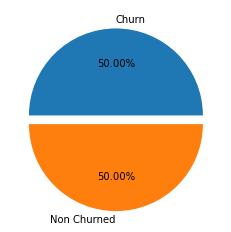

In [67]:
#Checking the new balanced distribution of target variable after doing synthetic minority oversampling
plt.pie(y_train_smo.value_counts(normalize=True)*100, labels=['Churn','Non Churned'],explode=(0,0.1),autopct='%1.2f%%')
plt.show()

## PCA on the data

In [68]:
pca = PCA(svd_solver='randomized', random_state=42)
pca.fit(X_train_smo)

PCA(random_state=42, svd_solver='randomized')

In [69]:
pca.components_

array([[-4.93089485e-03, -2.38205351e-03,  3.23118410e-04, ...,
         3.15028055e-03,  9.19028074e-03,  5.31126895e-03],
       [ 4.76414456e-05,  6.96245533e-03,  1.12246814e-02, ...,
        -4.21442455e-03,  1.06886895e-02,  1.02509597e-02],
       [ 8.22330795e-03, -2.03917746e-03,  4.94382313e-03, ...,
         4.88054756e-03, -9.21672625e-03,  5.52657448e-03],
       ...,
       [-0.00000000e+00, -2.28409843e-16, -5.60505843e-17, ...,
         5.20127061e-01, -1.12569302e-01, -9.10918480e-02],
       [-0.00000000e+00, -1.04204152e-16, -2.48034036e-16, ...,
         3.51781752e-01, -1.43109385e-01, -1.82056431e-02],
       [-0.00000000e+00,  3.10394691e-16,  3.72960389e-17, ...,
        -1.70702351e-01, -1.57754276e-01, -5.11811890e-01]])

In [70]:
pca.explained_variance_ratio_

array([5.30964575e-01, 1.18986550e-01, 8.14382659e-02, 4.62714407e-02,
       2.48645738e-02, 2.16204413e-02, 1.91728311e-02, 1.68217451e-02,
       1.38222095e-02, 1.11888508e-02, 8.29127313e-03, 7.39608728e-03,
       7.35010855e-03, 6.24567537e-03, 5.76070491e-03, 4.70922195e-03,
       4.34695654e-03, 3.73822562e-03, 3.65289423e-03, 3.57140072e-03,
       3.25623865e-03, 3.16967293e-03, 2.94896876e-03, 2.82209528e-03,
       2.63375617e-03, 2.46364396e-03, 2.33439283e-03, 2.22140639e-03,
       2.08542185e-03, 2.05128486e-03, 1.92280942e-03, 1.74847052e-03,
       1.63558638e-03, 1.46184306e-03, 1.33107608e-03, 1.27018023e-03,
       1.16823077e-03, 1.13626056e-03, 1.09543577e-03, 1.05440424e-03,
       9.49380559e-04, 8.84139586e-04, 8.08848664e-04, 7.60671510e-04,
       7.47289082e-04, 7.03114895e-04, 6.82563605e-04, 6.61558965e-04,
       6.02452126e-04, 5.85707723e-04, 5.78380971e-04, 5.42476737e-04,
       4.95733575e-04, 4.85477543e-04, 4.80883724e-04, 4.61167556e-04,
      

In [71]:
#Making a scree plot for the explained variance

var_cumu = np.cumsum(pca.explained_variance_ratio_)

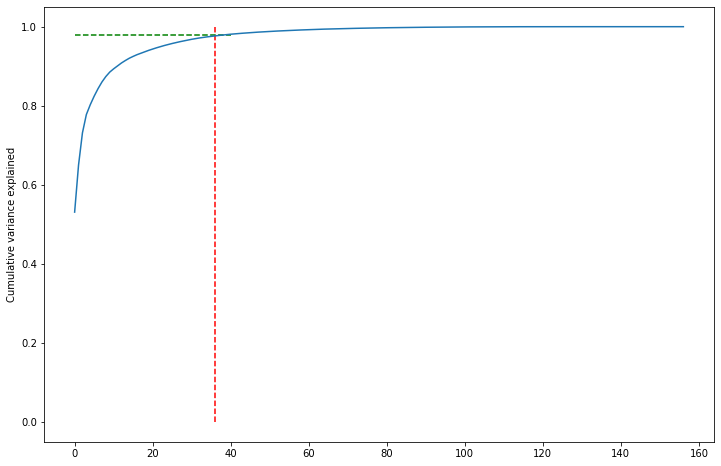

In [72]:
fig = plt.figure(figsize=[12,8])
plt.vlines(x=36, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.98, xmax=40, xmin=0, colors="g", linestyles="--")
plt.plot(var_cumu)
plt.ylabel("Cumulative variance explained")
plt.show()

The Scree plot shows that 36 components are enough to explain close to 99% variance

In [73]:
from sklearn.decomposition import IncrementalPCA
pca_final = IncrementalPCA(n_components=36)

In [74]:
X_train_pca = pca_final.fit_transform(X_train_smo)
X_train_pca.shape

(38430, 36)

In [75]:
X_test_pca = pca_final.transform(X_test)
X_test_pca.shape

(8986, 36)

In [76]:
corrmat = np.corrcoef(X_train_pca.transpose())

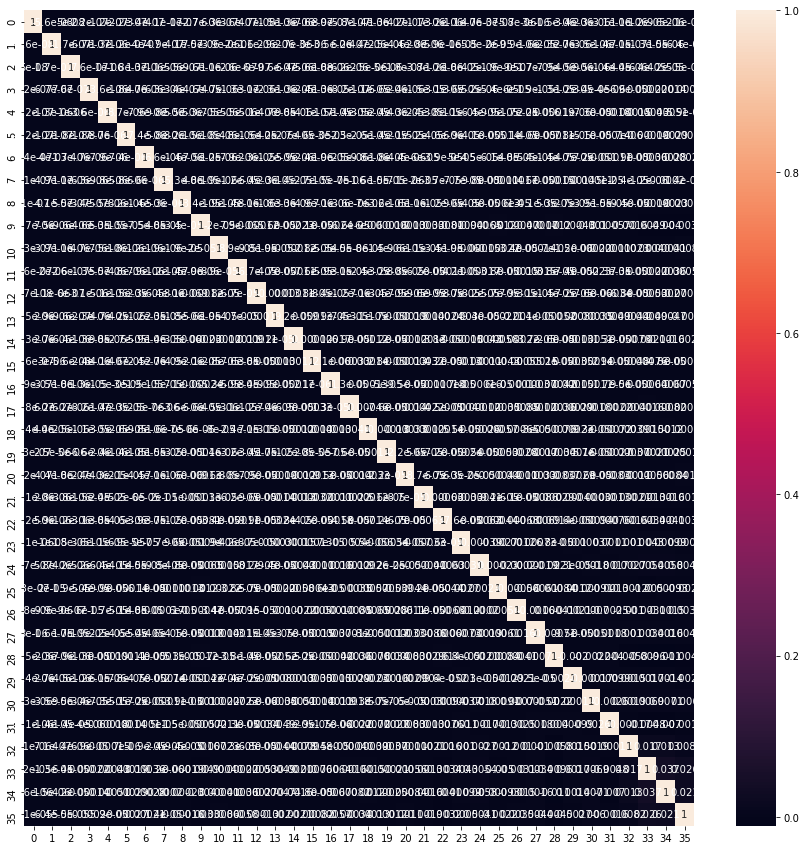

In [77]:
plt.figure(figsize=[15,15])
sns.heatmap(corrmat, annot=True)
plt.show()

In [78]:
corrmat_nodiag = corrmat - np.diagflat(corrmat.diagonal())
print("max corr:",corrmat_nodiag.max(), "min corr: ", corrmat_nodiag.min())

max corr: 0.03664039621995918 min corr:  -0.010991445185015408


Feature correlations are close to zero means we have removed the collinearity

## 1.0 Applying logistic regression on the data on our Principal components

In [79]:
model_pca_logit = LogisticRegression(class_weight='balanced')
                        
model_pca_logit.fit(X_train_pca, y_train_smo) 

LogisticRegression(class_weight='balanced')

### Model Prediction

In [80]:
# Getting the predicted values on the train set
y_train_pred = model_pca_logit.predict(X_train_pca)
y_train_pred[:10]

array([0, 1, 0, 0, 0, 0, 1, 0, 0, 0], dtype=int64)

In [81]:
y_train_pred_prob = model_pca_logit.predict_proba(X_train_pca)[:,1]

In [82]:
#Printing train score
print("Accuracy :",roc_auc_score(y_train_smo, y_train_pred))
print("Recall/Sensitivity :",recall_score(y_train_smo, y_train_pred))
print("AUC Score (Train) :",roc_auc_score(y_train_smo, y_train_pred_prob))

Accuracy : 0.8245381212594327
Recall/Sensitivity : 0.8441842310694769
AUC Score (Train) : 0.8978338370693215


In [83]:
# Predicting on test dataset
pred_probs_test = model_pca_logit.predict(X_test_pca)
confusion = confusion_matrix(y_test, pred_probs_test)
TP = confusion[1,1] # true positive
TN = confusion[0,0] # true negative
FP = confusion[0,1] # false positive
FN = confusion[1,0] # false negative

print("ROC_AUC_Score :",(roc_auc_score(y_test, pred_probs_test)))
print("Precision Score :",(precision_score(y_test, pred_probs_test)))
print("Sensitivity/Recall :",(TP / float(TP+FN)))
print("Specificity :",(TN / float(TN+FP)))
print("False Positive Rate :",(FP / float(TN+FP)))
print("Positive predictive value :",(TP / float(TP+FP)))
print("Negative predictive value :",(TN / float(TN+FN)))
print("Accuracy :",(accuracy_score(y_test,pred_probs_test)))

ROC_AUC_Score : 0.8144816605533705
Precision Score : 0.25211581291759466
Sensitivity/Recall : 0.8311306901615272
Specificity : 0.7978326309452137
False Positive Rate : 0.20216736905478627
Positive predictive value : 0.25211581291759466
Negative predictive value : 0.9829402165850764
Accuracy : 0.8003561095036724


In [84]:
##Creating new column 'predicted' with 1 if Converted_Prob > 0.5 else 0

y_train_pred = model_pca_logit.predict_proba(X_train_pca)[:,1]
y_train_pred_final = pd.DataFrame({'Churn':y_train_smo, 'Churn_Prob':y_train_pred})
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,predicted
0,0,0.185447,0
1,0,0.873146,1
2,0,0.237343,0
3,0,0.125877,0
4,0,0.070117,0


### Plotting the ROC Curve

In [85]:
# Function for ROC Curve
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [86]:
fpr, tpr, thresholds = roc_curve( y_train_pred_final.Churn, y_train_pred_final.Churn_Prob, drop_intermediate = False )

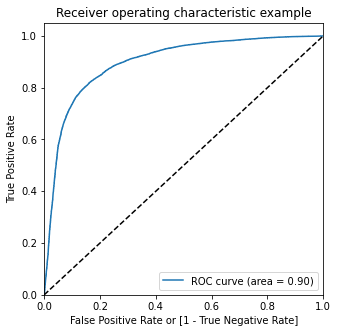

In [87]:
draw_roc(y_train_pred_final.Churn, y_train_pred_final.Churn_Prob)

The AUC is coming as 0.9 which is good result

### Finding Optimal Cutoff Point

In [88]:
#Finding Optimal cutoff probability where we get balanced sensitivity and specificity

# Creating columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.185447,0,1,1,0,0,0,0,0,0,0,0
1,0,0.873146,1,1,1,1,1,1,1,1,1,1,0
2,0,0.237343,0,1,1,1,0,0,0,0,0,0,0
3,0,0.125877,0,1,1,0,0,0,0,0,0,0,0
4,0,0.070117,0,1,0,0,0,0,0,0,0,0,0


In [89]:
# Calculating accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensitivity','specificity'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = confusion_matrix(y_train_pred_final.Churn, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    specificity = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensitivity = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensitivity,specificity]
print(cutoff_df)

     prob  accuracy  sensitivity  specificity
0.0   0.0  0.500000     1.000000     0.000000
0.1   0.1  0.672391     0.979391     0.365392
0.2   0.2  0.742363     0.957897     0.526828
0.3   0.3  0.783476     0.925943     0.641010
0.4   0.4  0.812490     0.893052     0.731928
0.5   0.5  0.824538     0.844184     0.804892
0.6   0.6  0.827609     0.788707     0.866511
0.7   0.7  0.810148     0.706375     0.913921
0.8   0.8  0.763934     0.578819     0.949050
0.9   0.9  0.581265     0.177466     0.985064


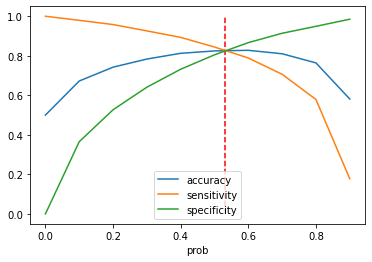

In [90]:
# Plotting accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensitivity','specificity'])
plt.vlines(x=0.53, ymax=1, ymin=0, colors="r", linestyles="--")
plt.show()

**From the curve above, 0.53 is the optimum point to take it as a cutoff probability when Sensitivity will be around 80%**

In [91]:
y_train_pred_final['final_predicted'] = y_train_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.53 else 0)

y_train_pred_final.head()

,Churn,Churn_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0.185447,0,1,1,0,0,0,0,0,0,0,0,0
1,0,0.873146,1,1,1,1,1,1,1,1,1,1,0,1
2,0,0.237343,0,1,1,1,0,0,0,0,0,0,0,0
3,0,0.125877,0,1,1,0,0,0,0,0,0,0,0,0
4,0,0.070117,0,1,0,0,0,0,0,0,0,0,0,0


In [92]:
# Predicting on train dataset with optimal cutoff probability
y_train_pred = model_pca_logit.predict_proba(X_train_pca)[:,1]
y_train_pred_final = pd.DataFrame({'Churn':y_train_smo, 'Churn_Prob':y_train_pred})
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.53 else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,predicted
0,0,0.185447,0
1,0,0.873146,1
2,0,0.237343,0
3,0,0.125877,0
4,0,0.070117,0


In [93]:
# Scores of train dataset

confusion = confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.predicted)
TP = confusion[1,1] # true positive
TN = confusion[0,0] # true negative
FP = confusion[0,1] # false positive
FN = confusion[1,0] # false negative

print("ROC_AUC_Score :",(roc_auc_score(y_train_pred_final.Churn, y_train_pred_final.predicted)))
print("Precision Score :",(precision_score(y_train_pred_final.Churn, y_train_pred_final.predicted)))
print("Sensitivity/Recall :",(TP / float(TP+FN)))
print("Specificity :",(TN / float(TN+FP)))
print("False Positive Rate :",(FP / float(TN+FP)))
print("Positive predictive value :",(TP / float(TP+FP)))
print("Negative predictive value :",(TN / float(TN+FN)))
print("Accuracy :",(accuracy_score(y_train_pred_final.Churn,y_train_pred_final.predicted)))

ROC_AUC_Score : 0.827192297684101
Precision Score : 0.826055388445182
Sensitivity/Recall : 0.828935727296383
Specificity : 0.8254488680718189
False Positive Rate : 0.1745511319281811
Positive predictive value : 0.826055388445182
Negative predictive value : 0.8283371631501985
Accuracy : 0.827192297684101


In [94]:
# Predicting on test dataset with optimal cutoff probability
y_test_pred = model_pca_logit.predict_proba(X_test_pca)[:,1]
y_test_pred_final = pd.DataFrame({'Churn':y_test, 'Churn_Prob':y_test_pred})
y_test_pred_final['predicted'] = y_test_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.53 else 0)
y_test_pred_final.head()

,Churn,Churn_Prob,predicted
48388,0,0.167338,0
29754,0,0.020056,0
50131,0,0.064165,0
66630,0,0.167128,0
91920,0,0.233958,0


In [95]:
# Scores of test dataset

confusion = confusion_matrix(y_test_pred_final.Churn, y_test_pred_final.predicted)
TP = confusion[1,1] # true positive
TN = confusion[0,0] # true negative
FP = confusion[0,1] # false positive
FN = confusion[1,0] # false negative

print("ROC_AUC_Score :",(roc_auc_score(y_test_pred_final.Churn, y_test_pred_final.predicted)))
print("Precision Score :",(precision_score(y_test_pred_final.Churn, y_test_pred_final.predicted)))
print("Sensitivity/Recall :",(TP / float(TP+FN)))
print("Specificity :",(TN / float(TN+FP)))
print("False Positive Rate :",(FP / float(TN+FP)))
print("Positive predictive value :",(TP / float(TP+FP)))
print("Negative predictive value :",(TN / float(TN+FN)))
print("Accuracy :",(accuracy_score(y_test_pred_final.Churn,y_test_pred_final.predicted)))

ROC_AUC_Score : 0.819697367525357
Precision Score : 0.27057115198451115
Sensitivity/Recall : 0.8208516886930984
Specificity : 0.8185430463576159
False Positive Rate : 0.1814569536423841
Positive predictive value : 0.27057115198451115
Negative predictive value : 0.9823699421965318
Accuracy : 0.8187180057867794


In [96]:
print(classification_report(y_test_pred_final.Churn, y_test_pred_final.predicted, target_names=['Not Churn','Churn'])) 

              precision    recall  f1-score   support

   Not Churn       0.98      0.82      0.89      8305
       Churn       0.27      0.82      0.41       681

    accuracy                           0.82      8986
   macro avg       0.63      0.82      0.65      8986
weighted avg       0.93      0.82      0.86      8986



Though the Precision Score is low, we have captured the most of the True Churn and False Churn HVC which can be targeted to take care of the business problem

## 2.0 Applying Random Forest Modeling

In [97]:
rf = RandomForestClassifier(random_state=42, n_jobs=-1)

In [98]:
# Create the parameter grid based on the results of random search 
params = {
    'max_depth': [1, 2, 5, 10, 20, 25, 30],
    'min_samples_leaf': [5, 10, 20, 50, 100, 150],
    'max_features': [2, 3, 5, 10],
    'n_estimators': [10, 25, 50, 75, 100],
    'min_samples_split': [50, 100, 150]
}

In [99]:
# Instantiate the grid search model
rf1 = GridSearchCV(estimator=rf, param_grid=params, 
                          cv=5, n_jobs=-1, verbose=1, scoring = "accuracy", return_train_score=True)

In [100]:
%%time
rf1.fit(X_train_pca, y_train_smo)

Fitting 5 folds for each of 2520 candidates, totalling 12600 fits
Wall time: 3h 36min 56s


GridSearchCV(cv=5, estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [1, 2, 5, 10, 20, 25, 30],
                         'max_features': [2, 3, 5, 10],
                         'min_samples_leaf': [5, 10, 20, 50, 100, 150],
                         'min_samples_split': [50, 100, 150],
                         'n_estimators': [10, 25, 50, 75, 100]},
             return_train_score=True, scoring='accuracy', verbose=1)

In [101]:
scores = rf1.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_max_features,param_min_samples_leaf,param_min_samples_split,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.257509,0.081690,0.321638,0.159302,1,2,5,50,10,"{'max_depth': 1, 'max_features': 2, 'min_sampl...",0.674603,0.678246,0.680328,0.673302,0.673692,0.676034,0.002769,2503,0.680491,0.675059,0.673595,0.675644,0.679905,0.676939,0.002750
1,0.537984,0.105712,0.392948,0.115427,1,2,5,50,25,"{'max_depth': 1, 'max_features': 2, 'min_sampl...",0.721051,0.730159,0.731590,0.719100,0.718970,0.724174,0.005539,2359,0.731818,0.725442,0.723784,0.724857,0.728305,0.726841,0.002903
2,0.927765,0.157791,0.286235,0.186170,1,2,5,50,50,"{'max_depth': 1, 'max_features': 2, 'min_sampl...",0.742519,0.754359,0.754228,0.744991,0.745121,0.748244,0.005026,2089,0.752537,0.753025,0.748764,0.748862,0.749675,0.750572,0.001837
3,1.505570,0.508294,1.150434,0.436352,1,2,5,50,75,"{'max_depth': 1, 'max_features': 2, 'min_sampl...",0.750325,0.759042,0.763206,0.753318,0.750325,0.755243,0.005097,1996,0.758782,0.753513,0.753610,0.756115,0.755822,0.755569,0.001937
4,2.293157,0.040846,0.374362,0.119677,1,2,5,50,100,"{'max_depth': 1, 'max_features': 2, 'min_sampl...",0.754359,0.757871,0.767890,0.757091,0.756440,0.758730,0.004726,1909,0.761840,0.756766,0.759042,0.760864,0.760701,0.759843,0.001782


In [102]:
rf_best = rf1.best_estimator_

In [103]:
rf_best

RandomForestClassifier(max_depth=30, max_features=10, min_samples_leaf=5,
                       min_samples_split=50, n_jobs=-1, random_state=42)

Creating helper functions to evaluate model performance and help plot the decision tree

In [104]:
# Importing required packages for visualization
from IPython.display import Image  
from six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz

In [105]:
def get_dt_graph(dt_classifier):
    dot_data = StringIO()
    export_graphviz(dt_classifier, out_file=dot_data, filled=True,rounded=True,
                    feature_names=pd.DataFrame(X_train_pca).columns, 
                    class_names=['Churn', "Non Churn"])
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return graph

In [106]:
def evaluate_model(dt_classifier):
    print("Train Accuracy :", accuracy_score(y_train_smo, dt_classifier.predict(X_train_pca)))
    print("Train Confusion Matrix:")
    print(confusion_matrix(y_train_smo, dt_classifier.predict(X_train_pca)))
    print("-"*50)
    print("Test Accuracy :", accuracy_score(y_test, dt_classifier.predict(X_test_pca)))
    print("Test Confusion Matrix:")
    print(confusion_matrix(y_test, dt_classifier.predict(X_test_pca)))

In [107]:
evaluate_model(rf_best)

Train Accuracy : 0.9448347645068956
Train Confusion Matrix:
[[17976  1239]
 [  881 18334]]
--------------------------------------------------
Test Accuracy : 0.8843756955263744
Test Confusion Matrix:
[[7473  832]
 [ 207  474]]


In [108]:
sample_tree = rf_best.estimators_[0]

In [109]:
gph = get_dt_graph(sample_tree)
Image(gph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.927219 to fit



In [110]:
#Fitting the final model with the best parameters obtained
rf2 = RandomForestClassifier(bootstrap=True,
                             max_depth=20,
                             min_samples_leaf=100,
                             min_samples_split=100,
                             max_features=10,
                             random_state=42, n_jobs=-1)

### Model Prediction

In [143]:
# Getting the predicted values on the train set
rf_pca = rf2.fit(X_train_pca,y_train_smo)
y_train_pred_rf = rf_pca.predict(X_train_pca)
y_train_pred_prob_rf = rf_pca.predict_proba(X_train_pca)[:,1]

In [144]:
#Printing train scores
print("Accuracy :",roc_auc_score(y_train_smo, y_train_pred_rf))
print("Recall/Sensitivity :",recall_score(y_train_smo, y_train_pred_rf))
print("AUC Score (Train) :",roc_auc_score(y_train_smo, y_train_pred_prob_rf))

Accuracy : 0.8604215456674474
Recall/Sensitivity : 0.8568306010928962
AUC Score (Train) : 0.9378302863044548


In [145]:
# Predicting on test dataset
pred_probs_test_rf = rf_pca.predict(X_test_pca)
confusion = confusion_matrix(y_test, pred_probs_test_rf)
TP = confusion[1,1] # true positive
TN = confusion[0,0] # true negative
FP = confusion[0,1] # false positive
FN = confusion[1,0] # false negative

print("ROC_AUC_Score :",(roc_auc_score(y_test, pred_probs_test_rf)))
print("Precision Score :",(precision_score(y_test, pred_probs_test_rf)))
print("Sensitivity/Recall :",(TP / float(TP+FN)))
print("Specificity :",(TN / float(TN+FP)))
print("False Positive Rate :",(FP / float(TN+FP)))
print("Positive predictive value :",(TP / float(TP+FP)))
print("Negative predictive value :",(TN / float(TN+FN)))
print("Accuracy :",(accuracy_score(y_test,pred_probs_test_rf)))

ROC_AUC_Score : 0.8094724707176205
Precision Score : 0.29537767756482525
Sensitivity/Recall : 0.7694566813509545
Specificity : 0.8494882600842866
False Positive Rate : 0.15051173991571343
Positive predictive value : 0.29537767756482525
Negative predictive value : 0.9782307265668331
Accuracy : 0.8434231026040507


In [146]:
##Creating new column 'predicted' with 1 if Converted_Prob > 0.5 else 0

y_train_pred_rf = rf_pca.predict_proba(X_train_pca)[:,1]
y_train_pred_final_rf = pd.DataFrame({'Churn':y_train_smo, 'Churn_Prob':y_train_pred_rf})
y_train_pred_final_rf['predicted'] = y_train_pred_final_rf.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final_rf.head()

,Churn,Churn_Prob,predicted
0,0,0.214924,0
1,0,0.860527,1
2,0,0.263061,0
3,0,0.147018,0
4,0,0.081826,0


## Finding optimal cutoff point

In [147]:
#Finding Optimal cutoff probability where we get balanced sensitivity and specificity

# Creating columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final_rf[i]= y_train_pred_final_rf.Churn_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final_rf.head()

,Churn,Churn_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.214924,0,1,1,1,0,0,0,0,0,0,0
1,0,0.860527,1,1,1,1,1,1,1,1,1,1,0
2,0,0.263061,0,1,1,1,0,0,0,0,0,0,0
3,0,0.147018,0,1,1,0,0,0,0,0,0,0,0
4,0,0.081826,0,1,0,0,0,0,0,0,0,0,0


In [148]:
# Calculating accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensitivity','specificity'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = confusion_matrix(y_train_pred_final_rf.Churn, y_train_pred_final_rf[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    specificity = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensitivity = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensitivity,specificity]
print(cutoff_df)

     prob  accuracy  sensitivity  specificity
0.0   0.0  0.500000     1.000000     0.000000
0.1   0.1  0.604658     0.999896     0.209420
0.2   0.2  0.739735     0.993911     0.485558
0.3   0.3  0.819880     0.966224     0.673536
0.4   0.4  0.857013     0.924278     0.789748
0.5   0.5  0.860422     0.856831     0.864012
0.6   0.6  0.845147     0.774603     0.915691
0.7   0.7  0.803461     0.657143     0.949779
0.8   0.8  0.731642     0.485298     0.977986
0.9   0.9  0.605334     0.212594     0.998074


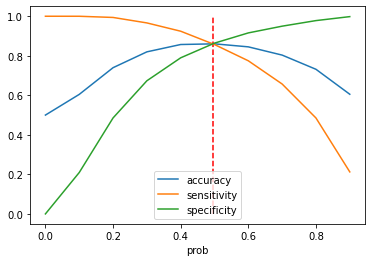

In [149]:
# Plotting accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensitivity','specificity'])
plt.vlines(x=0.495, ymax=1, ymin=0, colors="r", linestyles="--")
plt.show()

**From the curve above, 0.495 is the optimum point to take it as a cutoff probability when sensitivity around 0.85**

In [150]:
y_train_pred_final_rf['final_predicted'] = y_train_pred_final_rf.Churn_Prob.map( lambda x: 1 if x > 0.495 else 0)

y_train_pred_final.head()

,Churn,Churn_Prob,predicted
0,0,0.000979,0
1,0,0.080744,0
2,0,0.003022,0
3,0,0.002608,0
4,0,0.001081,0


In [151]:
# Predicting on train dataset with optimal cutoff probability
y_train_pred_rf = rf_pca.predict_proba(X_train_pca)[:,1]
y_train_pred_final_rf = pd.DataFrame({'Churn':y_train_smo, 'Churn_Prob':y_train_pred_rf})
y_train_pred_final_rf['predicted'] = y_train_pred_final_rf.Churn_Prob.map(lambda x: 1 if x > 0.495 else 0)
y_train_pred_final_rf.head()

,Churn,Churn_Prob,predicted
0,0,0.214924,0
1,0,0.860527,1
2,0,0.263061,0
3,0,0.147018,0
4,0,0.081826,0


In [152]:
# Scores of train dataset

confusion = confusion_matrix(y_train_pred_final_rf.Churn, y_train_pred_final_rf.predicted)
TP = confusion[1,1] # true positive
TN = confusion[0,0] # true negative
FP = confusion[0,1] # false positive
FN = confusion[1,0] # false negative

print("ROC_AUC_Score :",(roc_auc_score(y_train_pred_final_rf.Churn, y_train_pred_final_rf.predicted)))
print("Precision Score :",(precision_score(y_train_pred_final_rf.Churn, y_train_pred_final_rf.predicted)))
print("Sensitivity/Recall :",(TP / float(TP+FN)))
print("Specificity :",(TN / float(TN+FP)))
print("False Positive Rate :",(FP / float(TN+FP)))
print("Positive predictive value :",(TP / float(TP+FP)))
print("Negative predictive value :",(TN / float(TN+FN)))
print("Accuracy :",(accuracy_score(y_train_pred_final_rf.Churn,y_train_pred_final_rf.predicted)))

ROC_AUC_Score : 0.8609159510798856
Precision Score : 0.8614614823308663
Sensitivity/Recall : 0.8601613322924798
Specificity : 0.8616705698672912
False Positive Rate : 0.13832943013270882
Positive predictive value : 0.8614614823308663
Negative predictive value : 0.8603720640199543
Accuracy : 0.8609159510798855


In [153]:
# Predicting on test dataset with optimal cutoff probability
y_test_pred_rf = rf_pca.predict_proba(X_test_pca)[:,1]
y_test_pred_final_rf = pd.DataFrame({'Churn':y_test, 'Churn_Prob':y_test_pred_rf})
y_test_pred_final_rf['predicted'] = y_test_pred_final_rf.Churn_Prob.map(lambda x: 1 if x > 0.495 else 0)
y_test_pred_final_rf.head()

,Churn,Churn_Prob,predicted
48388,0,0.268926,0
29754,0,0.043924,0
50131,0,0.122202,0
66630,0,0.224851,0
91920,0,0.431790,0


In [154]:
# Scores of test dataset

confusion = confusion_matrix(y_test_pred_final_rf.Churn, y_test_pred_final_rf.predicted)
TP = confusion[1,1] # true positive
TN = confusion[0,0] # true negative
FP = confusion[0,1] # false positive
FN = confusion[1,0] # false negative

print("ROC_AUC_Score :",(roc_auc_score(y_test_pred_final_rf.Churn, y_test_pred_final_rf.predicted)))
print("Precision Score :",(precision_score(y_test_pred_final_rf.Churn, y_test_pred_final_rf.predicted)))
print("Sensitivity/Recall :",(TP / float(TP+FN)))
print("Specificity :",(TN / float(TN+FP)))
print("False Positive Rate :",(FP / float(TN+FP)))
print("Positive predictive value :",(TP / float(TP+FP)))
print("Negative predictive value :",(TN / float(TN+FN)))
print("Accuracy :",(accuracy_score(y_test_pred_final_rf.Churn,y_test_pred_final_rf.predicted)))

ROC_AUC_Score : 0.8112052343607031
Precision Score : 0.2936596218020022
Sensitivity/Recall : 0.775330396475771
Specificity : 0.8470800722456352
False Positive Rate : 0.15291992775436483
Positive predictive value : 0.2936596218020022
Negative predictive value : 0.9787145242070117
Accuracy : 0.8416425550856889


In [155]:
print(classification_report(y_test_pred_final_rf.Churn, y_test_pred_final_rf.predicted, target_names=['Not Churn','Churn'])) 

              precision    recall  f1-score   support

   Not Churn       0.98      0.85      0.91      8305
       Churn       0.29      0.78      0.43       681

    accuracy                           0.84      8986
   macro avg       0.64      0.81      0.67      8986
weighted avg       0.93      0.84      0.87      8986



Though the Precision Score is low, we have captured the most of the True Churn and False Churn HVC which can be targeted to take care of the business problem

## 3.0 Applying XGBoost Modeling

In [124]:
xgb = XGBClassifier(random_state=42, n_jobs=-1)

In [125]:
# Create the parameter grid based on the results of random search 
parameters = {'learning_rate': [0.1, 0.2, 0.3],
              'max_depth': [2, 4, 6, 8],
              'min_child_weight': [3, 7, 10, 20],
              'n_estimators': [50, 100, 300]}

from sklearn.metrics import make_scorer
scorer = make_scorer(roc_auc_score,
                    greater_is_better=True,
                    needs_proba=True,
                    needs_threshold=False)

clf_xgb = GridSearchCV(estimator=xgb,
                       param_grid=parameters,
                       n_jobs=-1,
                       cv=5,
                       scoring=scorer,
                       refit=True)

In [126]:
%%time
clf_xgb.fit(X_train_pca, y_train_smo)

[07:06:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Wall time: 2h 14min 57s


GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     enable_categorical=False, gamma=None,
                                     gpu_id=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,...
                                     num_parallel_tree=None, predictor=None,
                                     random_state=42, reg_alpha=None,
                                     reg_lambda=None, scale_pos_weight=None,
                                     subsample=None, tree_me

In [127]:
print(clf_xgb.best_params_)
print(clf_xgb.best_score_)
print(clf_xgb.best_estimator_)

{'learning_rate': 0.2, 'max_depth': 8, 'min_child_weight': 3, 'n_estimators': 300}
0.9878307961682887
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.2, max_delta_step=0,
              max_depth=8, min_child_weight=3, missing=nan,
              monotone_constraints='()', n_estimators=300, n_jobs=-1,
              num_parallel_tree=1, predictor='auto', random_state=42,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)


In [128]:
#Fitting the final model with the best parameters obtained
xgb2 = XGBClassifier(learning_rate=0.2,
                     max_depth=8,
                     min_child_weight=3,
                     n_estimators=300,
                     random_state=42, n_jobs=-1)

### Model Prediction

In [156]:
# Getting the predicted values on the train set
xgb_pca = xgb2.fit(X_train_pca,y_train_smo)
y_train_pred_xgb = xgb_pca.predict(X_train_pca)
y_train_pred_prob_xgb = xgb_pca.predict_proba(X_train_pca)[:,1]

[13:16:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [157]:
#Printing train scores
print("Accuracy :",roc_auc_score(y_train_smo, y_train_pred_xgb))
print("Recall/Sensitivity :",recall_score(y_train_smo, y_train_pred_xgb))
print("AUC Score (Train) :",roc_auc_score(y_train_smo, y_train_pred_prob_xgb))

Accuracy : 1.0
Recall/Sensitivity : 1.0
AUC Score (Train) : 1.0


In [158]:
# Predicting on test dataset
pred_probs_test_xgb = xgb_pca.predict(X_test_pca)
confusion = confusion_matrix(y_test, pred_probs_test_xgb)
TP = confusion[1,1] # true positive
TN = confusion[0,0] # true negative
FP = confusion[0,1] # false positive
FN = confusion[1,0] # false negative

print("ROC_AUC_Score :",(roc_auc_score(y_test, pred_probs_test_xgb)))
print("Precision Score :",(precision_score(y_test, pred_probs_test_xgb)))
print("Sensitivity/Recall :",(TP / float(TP+FN)))
print("Specificity :",(TN / float(TN+FP)))
print("False Positive Rate :",(FP / float(TN+FP)))
print("Positive predictive value :",(TP / float(TP+FP)))
print("Negative predictive value :",(TN / float(TN+FN)))
print("Accuracy :",(accuracy_score(y_test,pred_probs_test_xgb)))

ROC_AUC_Score : 0.7562751239677459
Precision Score : 0.4
Sensitivity/Recall : 0.5844346549192364
Specificity : 0.9281155930162552
False Positive Rate : 0.07188440698374474
Positive predictive value : 0.4
Negative predictive value : 0.964585158303091
Accuracy : 0.9020698864900957


In [159]:
##Creating new column 'predicted' with 1 if Converted_Prob > 0.5 else 0

y_train_pred_xgb = xgb_pca.predict_proba(X_train_pca)[:,1]
y_train_pred_final_xgb = pd.DataFrame({'Churn':y_train_smo, 'Churn_Prob':y_train_pred_xgb})
y_train_pred_final_xgb['predicted'] = y_train_pred_final_xgb.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final_xgb.head()

,Churn,Churn_Prob,predicted
0,0,0.000979,0
1,0,0.080744,0
2,0,0.003022,0
3,0,0.002608,0
4,0,0.001081,0


### Finding Optimal Cutoff Point

In [160]:
#Finding Optimal cutoff probability where we get balanced sensitivity and specificity

# Creating columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final_xgb[i]= y_train_pred_final_xgb.Churn_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final_xgb.head()

,Churn,Churn_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.000979,0,1,0,0,0,0,0,0,0,0,0
1,0,0.080744,0,1,0,0,0,0,0,0,0,0,0
2,0,0.003022,0,1,0,0,0,0,0,0,0,0,0
3,0,0.002608,0,1,0,0,0,0,0,0,0,0,0
4,0,0.001081,0,1,0,0,0,0,0,0,0,0,0


In [161]:
# Calculating accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensitivity','specificity'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = confusion_matrix(y_train_pred_final_xgb.Churn, y_train_pred_final_xgb[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    specificity = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensitivity = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensitivity,specificity]
print(cutoff_df)

     prob  accuracy  sensitivity  specificity
0.0   0.0  0.500000     1.000000     0.000000
0.1   0.1  0.990008     1.000000     0.980016
0.2   0.2  0.999011     1.000000     0.998022
0.3   0.3  0.999896     1.000000     0.999792
0.4   0.4  1.000000     1.000000     1.000000
0.5   0.5  1.000000     1.000000     1.000000
0.6   0.6  1.000000     1.000000     1.000000
0.7   0.7  1.000000     1.000000     1.000000
0.8   0.8  0.999922     0.999844     1.000000
0.9   0.9  0.998595     0.997190     1.000000


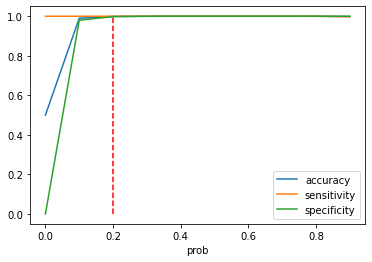

In [162]:
# Plotting accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensitivity','specificity'])
plt.vlines(x=0.2, ymax=1, ymin=0, colors="r", linestyles="--")
plt.show()

**From the curve above, 0.2 is the optimum point to take it as a cutoff probability when sensitivity around 1.00**

In [163]:
y_train_pred_final_xgb['final_predicted'] = y_train_pred_final_xgb.Churn_Prob.map( lambda x: 1 if x > 0.2 else 0)

y_train_pred_final_xgb.head()

,Churn,Churn_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0.000979,0,1,0,0,0,0,0,0,0,0,0,0
1,0,0.080744,0,1,0,0,0,0,0,0,0,0,0,0
2,0,0.003022,0,1,0,0,0,0,0,0,0,0,0,0
3,0,0.002608,0,1,0,0,0,0,0,0,0,0,0,0
4,0,0.001081,0,1,0,0,0,0,0,0,0,0,0,0


In [164]:
# Predicting on train dataset with optimal cutoff probability
y_train_pred_xgb = xgb_pca.predict_proba(X_train_pca)[:,1]
y_train_pred_final_xgb = pd.DataFrame({'Churn':y_train_smo, 'Churn_Prob':y_train_pred_xgb})
y_train_pred_final_xgb['predicted'] = y_train_pred_final_xgb.Churn_Prob.map(lambda x: 1 if x > 0.2 else 0)
y_train_pred_final_xgb.head()

,Churn,Churn_Prob,predicted
0,0,0.000979,0
1,0,0.080744,0
2,0,0.003022,0
3,0,0.002608,0
4,0,0.001081,0


In [165]:
# Scores of train dataset

confusion = confusion_matrix(y_train_pred_final_xgb.Churn, y_train_pred_final_xgb.predicted)
TP = confusion[1,1] # true positive
TN = confusion[0,0] # true negative
FP = confusion[0,1] # false positive
FN = confusion[1,0] # false negative

print("ROC_AUC_Score :",(roc_auc_score(y_train_pred_final_xgb.Churn, y_train_pred_final_xgb.predicted)))
print("Precision Score :",(precision_score(y_train_pred_final_xgb.Churn, y_train_pred_final_xgb.predicted)))
print("Sensitivity/Recall :",(TP / float(TP+FN)))
print("Specificity :",(TN / float(TN+FP)))
print("False Positive Rate :",(FP / float(TN+FP)))
print("Positive predictive value :",(TP / float(TP+FP)))
print("Negative predictive value :",(TN / float(TN+FN)))
print("Accuracy :",(accuracy_score(y_train_pred_final_xgb.Churn,y_train_pred_final_xgb.predicted)))

ROC_AUC_Score : 0.9990111891751237
Precision Score : 0.9980262816184491
Sensitivity/Recall : 1.0
Specificity : 0.9980223783502472
False Positive Rate : 0.0019776216497527973
Positive predictive value : 0.9980262816184491
Negative predictive value : 1.0
Accuracy : 0.9990111891751235


In [166]:
# Predicting on test dataset with optimal cutoff probability
y_test_pred_xgb = xgb_pca.predict_proba(X_test_pca)[:,1]
y_test_pred_final_xgb = pd.DataFrame({'Churn':y_test, 'Churn_Prob':y_test_pred_xgb})
y_test_pred_final_xgb['predicted'] = y_test_pred_final_xgb.Churn_Prob.map(lambda x: 1 if x > 0.2 else 0)
y_test_pred_final_xgb.head()

,Churn,Churn_Prob,predicted
48388,0,0.144133,0
29754,0,0.000013,0
50131,0,0.000264,0
66630,0,0.018172,0
91920,0,0.021259,0


In [167]:
# Scores of test dataset

confusion = confusion_matrix(y_test_pred_final_xgb.Churn, y_test_pred_final_xgb.predicted)
TP = confusion[1,1] # true positive
TN = confusion[0,0] # true negative
FP = confusion[0,1] # false positive
FN = confusion[1,0] # false negative

print("ROC_AUC_Score :",(roc_auc_score(y_test_pred_final_xgb.Churn, y_test_pred_final_xgb.predicted)))
print("Precision Score :",(precision_score(y_test_pred_final_xgb.Churn, y_test_pred_final_xgb.predicted)))
print("Sensitivity/Recall :",(TP / float(TP+FN)))
print("Specificity :",(TN / float(TN+FP)))
print("False Positive Rate :",(FP / float(TN+FP)))
print("Positive predictive value :",(TP / float(TP+FP)))
print("Negative predictive value :",(TN / float(TN+FN)))
print("Accuracy :",(accuracy_score(y_test_pred_final_xgb.Churn,y_test_pred_final_xgb.predicted)))

ROC_AUC_Score : 0.7895941354791313
Precision Score : 0.32142857142857145
Sensitivity/Recall : 0.7004405286343612
Specificity : 0.8787477423239013
False Positive Rate : 0.12125225767609873
Positive predictive value : 0.32142857142857145
Negative predictive value : 0.9728072513996268
Accuracy : 0.8652348097039839


In [168]:
print(classification_report(y_test_pred_final_xgb.Churn, y_test_pred_final_xgb.predicted, target_names=['Not Churn','Churn'])) 

              precision    recall  f1-score   support

   Not Churn       0.97      0.88      0.92      8305
       Churn       0.32      0.70      0.44       681

    accuracy                           0.87      8986
   macro avg       0.65      0.79      0.68      8986
weighted avg       0.92      0.87      0.89      8986



### Final High Performance Model Selection

**Train and test Recall score of Logistic Regression:**
- Train Sensitivity/Recall:0.828935727296383
- Test Sensitivity/Recall:0.8208516886930984

**Train and test Recall score of Random forest:**
- Train Sensitivity/Recall:0.8601613322924798
- Test Sensitivity/Recall:0.775330396475771

**Train and test Recall score of XGBoost:**
- Train Sensitivity/Recall:1.0
- Test Sensitivity/Recall:0.7004405286343612

- Recall/Sensitivity score need to be considered in this case study as Telecom company will not like any high value customer to churn so we have to find out All high value customers who may leave in future. Company may be willing to bear the burden of few extra customers who may not churn but will be classified as churn. So for a good model, overall recall score will be considered. Logistics Regression will be chosen in this case.

- As we can see that Train Recall score of XGBoost and Random forest is better than Logistics Regression but Test Recall score of Logistics Regression is better as compared to XGBoost and Random forest. Difference in between Train and test score is very minimum for Logistic Regression which seems the model is stable and robust.

### Interpretable Model for identifying attributes

- Building another model with the main objective of identifying important predictor attributes which help the business understand indicators of churn.
- We are choosing here Random Forest model to identify recommended strategies

In [169]:
#best hyperparameter selection
rf3 = RandomForestClassifier(bootstrap=True,
                             max_depth=20,
                             min_samples_leaf=100,
                             min_samples_split=100,
                             max_features=10,
                             random_state=42, n_jobs=-1)

In [170]:
# fit
rf3.fit(X_train_smo,y_train_smo)

RandomForestClassifier(max_depth=20, max_features=10, min_samples_leaf=100,
                       min_samples_split=100, n_jobs=-1, random_state=42)

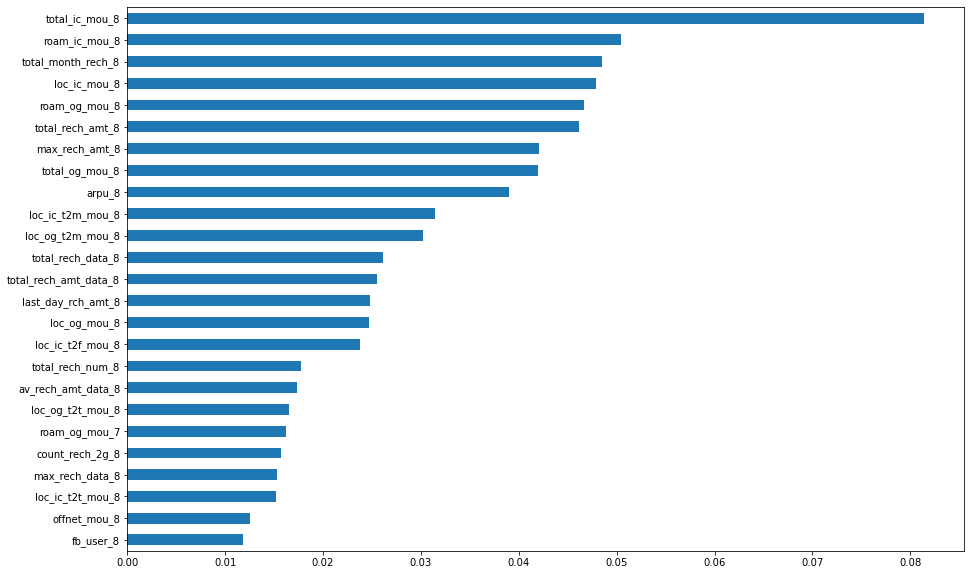

In [171]:
plt.figure(figsize=(15,10))
important_features = pd.Series(rf3.feature_importances_, index=X.columns)
important_features.nlargest((25)).sort_values().plot(kind='barh', align='center')
plt.show()

**Needless to say, the Telecom Company need to focus on the features of the month of August (Action Phase) to identify high value customers who may churn in future cause**

- Looking into some of the features:
1. total_ic_mou_8 : Total incoming calls Minutes of usage - voice calls in 8th Month
2. roam_ic_mou_8 : Roaming incoming calls Minutes of usage - voice calls in 8th Month
3. total_month_rech_8 : Total monthly Recharge amount (for call and data) in 8th month
4. loc_ic_mou_8 : Local Incoming calls Minutes of usage - voice calls in 8th Month
5. roam_og_mou_8 : Roaming outgoing calls Minutes of usage - voice calls in 8th Month
6. total_rech_amt_8 : Total recharge amount in 8th month
7. max_rech_amt_8 : Max recharge amount in 8th month
8. total_og_mou_8 : Total Outgoing calls mobile Minutes of usage - voice calls in 8th Month
9. arpu_8 : Average Revenue per user
10. loc_ic_t2m_mou_8 : Local Incoming calls Operator T to other operator mobile Minutes of usage - voice calls in 8th Month
11. loc_og_t2m_mou_8 : Local Outgoing calls Operator T to other operator mobile Minutes of usage - voice calls in 8th Month
12. total_rech_data_8 : Total number of recharges for mobile internet data in 8th month
13. total_rech_amt_data_8 : Monthly Recharge amount for mobile internet data in 8th month
14. last_day_rch_amt_8 : Last recharge amount in 8th month
15. loc_og_mou_8 : Local Outgoing calls mobile Minutes of usage - voice calls in 8th Month



**Recommended strategies and suggestions**

- As mentioned above, these key features to be focused and monitored for identifying potential churn cases.
- Total incoming and outgoing calls minutes of usage to be checked. If the numbers are dropping means customer is switching or already swicthed to competitor service provider.
- Also it may happen that the customer is using the services for incoming calls only and he/she has stopped using outgoing calls facilities. so these corresponding MOU measurement should also gave a good indication.
- Total and maximum monthly recharge amount for calls and internet data also a very good predictor. Lesser recharge means the customer is not happy.
- Total data usage and number of data recharge also indicates the behaviour of customer.
- Average reveneu per user to be monitored.
- After identifying, Potential Churn customers may be retained by providing them extra discount on recharge / extra free data usage / extra MOU / additional call MOU benefits / STD and roaming benefits according to the business policies and further management discussion.